# TF Triplet Net for Identifying Architectural Style of Buildings Facades

**AUTHOR: CAMELIA CIOLAC**  
ciolac_c@inria-alumni.fr

In this mini-project we train a Tensorflow model to identify the  architectural style of a church facade. Initially we include three styles :
- "CLASSIC" : Classic , Classical Revival , Neo-Classic
- "GOTHIC" : Gothic , Neo-Gothic
- "BAROQUE" : Baroque , Rococo, Baroque Revival

Moreover, we use only a few exemplars per class (i.e. class representatives / seeds) and perform few-shot learning via a Triplet Net.



In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
from IPython.core.display import display, HTML
#display(HTML("<style>.container { width:100% !important; }</style>"))

from matplotlib.pyplot import imshow
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from matplotlib.patches import Rectangle, Circle
from matplotlib.offsetbox import TextArea, DrawingArea, OffsetImage, AnnotationBbox
from mpl_toolkits import mplot3d
from mpl_toolkits.mplot3d import axes3d

import seaborn as sns
%matplotlib inline

In [ ]:
!mkdir -p "/content/gdrive/My Drive/architecture_fsl"

In [ ]:
!sudo apt-get install tree > /dev/null 2>&1

!pip install annoy

     |████████████████████████████████| 655kB 7.8MB/s 
  Created wheel for annoy: filename=annoy-1.17.0-cp36-cp36m-linux_x86_64.whl size=390355 sha256=33b39a1107479761909ea5c34f7eb0f92bc7833b169c9a3694fe5f2c1e4faa26
  Stored in directory: /root/.cache/pip/wheels/3a/c5/59/cce7e67b52c8e987389e53f917b6bb2a9d904a03246fadcb1e
Successfully built annoy


In [ ]:
import pandas as pd
import numpy as np
import math
import scipy.interpolate
import scipy.stats
from sklearn.model_selection import train_test_split

from PIL import Image as pilim
import collections as coll

import pprint
from tabulate import tabulate

import glob
import json
import shutil

from multiprocessing import Pool
import shlex
import tempfile
import subprocess

import re

import umap

from annoy import AnnoyIndex

import cv2
cv2.__version__

'4.1.2'

In [ ]:
import os
#logging levels : 0 = INFO , 1 = WARN , 2 = ERROR, 3 = none (not used in TF2)
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2' 

import tensorflow as tf
from tensorflow.python.lib.io import file_io
import tensorflow_hub as hub
print("TF version:", tf.__version__)

#logging level for TF2
tf.get_logger().setLevel('ERROR')

#devices discovered by TF2
physical_devices = tf.config.list_physical_devices()
for pdev in physical_devices:
  print(pdev)


import tensorflow_addons as tfa

TF version: 2.3.0
PhysicalDevice(name='/physical_device:CPU:0', device_type='CPU')
PhysicalDevice(name='/physical_device:XLA_CPU:0', device_type='XLA_CPU')
PhysicalDevice(name='/physical_device:XLA_GPU:0', device_type='XLA_GPU')
PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')


In [ ]:
#GPU info - NVIDIA System Management Interface
!nvidia-smi 

Sun Dec  6 09:53:02 2020       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 455.45.01    Driver Version: 418.67       CUDA Version: 10.1     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   42C    P8    10W /  70W |     10MiB / 15079MiB |      0%      Default |
|                               |                      |                 ERR! |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [ ]:
import warnings

with warnings.catch_warnings():
    warnings.filterwarnings("ignore",category=DeprecationWarning)
    warnings.filterwarnings("ignore",category=FutureWarning)
    

## Download a set of images

In [ ]:
dict_images_dw = {
    "baroque":[
       {"url": "https://files.structurae.net/files/photos/1/igreja_dos_clerigos-_em_portugal_porto.jpg", "name": "Clerigos Church, Porto"},
       {"url": "https://upload.wikimedia.org/wikipedia/commons/b/ba/Puglia_Lecce3_tango7174.jpg", "name": "Santa Croce Church, Lecce"},
       {"url": "https://mapio.net/images-p/42506036.jpg", "name": "Cathedral Church of Saint Mary, Murcia"},
       {"url": "https://www.bordeaux-hotel.com/wp-content/uploads/2017/10/notre-dame.jpg", "name": "Eglise Notre-Dame, Bordeaux"},
       {"url": "https://www.parismarais.com/img/editor/15418098479_251d9c78b7_b.jpg", "name": "Eglise Saint Paul-Saint Louis, Paris"},
       {"url": "https://www.wondersofsicily.com/images/700x1000-Siracusa-Duomo-20140604_Torild-Egge_7512.jpg", "name": "Dome Of Siracusa"},
       {"url": "https://i.pinimg.com/originals/bb/ae/ce/bbaeceec11dc1ca0887b427e8414fe71.jpg", "name": "Chiesa del Gesu, Rome"},
       {"url": "https://colosseumrometickets.com/wp-content/uploads/2018/10/Church-of-the-Ges%C3%B9.jpg", "name": "Chiesa del Gesu, Rome"},
       {"url": "https://www.sposisicilia.com/media/k2/items/cache/97d2860871f3d35e35f6eb0477d3015a_XL.jpg", "name": "Chiesa di Santa Maria della Pieta, Palermo"},
       {"url": "https://i.pinimg.com/originals/66/86/f0/6686f0b155b721bedfc01fd770a29d31.jpg", "name": "Basilica di Santa Maria della Salute, Venice"},
       {"url": "https://thumbs.dreamstime.com/b/basilica-di-santa-maria-della-salute-venice-november-november-venice-italy-s-roman-catholic-church-minor-64498588.jpg", "name": "Basilica di Santa Maria della Salute, Venice"},
       {"url": "https://upload.wikimedia.org/wikipedia/commons/9/9c/The_Val-de-Grace.jpg", "name": "Catholic Church of the Val-de-Grace, Paris"},
       {"url": "https://cdn.britannica.com/18/123418-050-AB979128/Church-Paris-Val-de-Grace-Jacques-Lemercier-Francois-Mansart.jpg", "name": "Catholic Church of the Val-de-Grace, Paris"},
       {"url": "https://www.au-temps-pour-moi.fr/IMG/jpg/04_l_eglise_du_val_de_grace_a_ete_dessinee_par_francois_mansart_a_la_demande_de_anne_d_autriche.jpg", "name": "Catholic Church of the Val-de-Grace, Paris"},
       {"url": "https://upload.wikimedia.org/wikipedia/commons/5/55/Colonna_-_S_Maria_Maddalena.JPG", "name": "Santa Maria Maddalena, Rome"},
       {"url": "https://upload.wikimedia.org/wikipedia/commons/e/e3/Chiesa_di_Santa_Maria_Maddalena_Roma.JPG", "name": "Santa Maria Maddalena, Rome"},
       {"url": "https://pbs.twimg.com/media/CIv8xvnWwAA8byB.jpg", "name": "Chiesa di San Carlino alle Quattro Fontane, Rome"},
       {"url": "https://upload.wikimedia.org/wikipedia/commons/0/0e/Santa_Susanna_%28Rome%29.jpg", "name": "Santa Susanna alle Terme di Diocleziano, Rome"},
       {"url": "https://guias-viajar.com/wp-content/uploads/2017/05/murcia-catedral-005-1.jpg", "name": "Cathedral Church of Saint Mary, Murcia"},
       {"url": "https://i.pinimg.com/originals/64/29/ee/6429ee86302338d2799f85ab1c0efaed.jpg", "name": "Cathedral of the Incarnation in Guadix"},
       {"url": "https://www.eccellenzesiciliane.it/images/territorio/catania/catania/catania_collegiata.jpg", "name": "Basilica della Collegiata, Catania"},
       {"url": "https://enthusiastical.files.wordpress.com/2013/05/v061124-057a.jpg", "name": "Basilica di Santa Maria della Salute, Venice"},
       {"url": "https://upload.wikimedia.org/wikipedia/commons/0/04/Chiesa_di_San_Moise.jpg", "name": " Chiesa di San Moise, Venice"},
       {"url": "https://mapio.net/images-p/20141571.jpg", "name": "Sint-Michielskerk, Leuven"},
       {"url": "https://upload.wikimedia.org/wikipedia/commons/1/12/Leuven_Sint-Michielskerk.jpg", "name": "Sint-Michielskerk, Leuven"},
       {"url": "https://i.pinimg.com/originals/3b/3a/f9/3b3af9b8c5b3f72a14dc878f6fa4c241.jpg", "name": "Sint-Michielskerk, Leuven"},
       {"url": "https://upload.wikimedia.org/wikipedia/commons/5/54/Cathedral_Ragusa_Ibla.JPG", "name":"Ragusa Cathedral San Giorgio, Ragusa"},
       {"url": "https://i.pinimg.com/originals/ee/53/68/ee5368879ef9fdbc00c1cd87788ceb37.jpg", "name": "Eglise Saint-Gervais-Saint-Protais, Paris"},
       {"url": "https://www.parismarais.com/img/editor/P1240932_Paris_IV_eglise_St-Gervais-St-Protais_facade_rwk.jpg", "name": "Eglise Saint-Gervais-Saint-Protais, Paris"},
       {"url": "https://upload.wikimedia.org/wikipedia/commons/e/e2/Santa_croce_lecce.jpg", "name": "Santa Croce Church, Lecce"},
       {"url": "https://upload.wikimedia.org/wikipedia/commons/d/d9/Gozo_-_Xewkija_-_Church.JPG", "name": "Church of St. John The Baptist Xewkija, Gozo"},
       {"url": "https://upload.wikimedia.org/wikipedia/commons/2/2d/Versailles_eglise_notre-dame.jpg", "name": "Church of Notre-Dame, Versailles"},
       {"url": "https://upload.wikimedia.org/wikipedia/commons/thumb/e/ec/Modica-SGiorgio.jpg/1200px-Modica-SGiorgio.jpg", "name":"Duomo of San Giorgio, Modica"},
       {"url": "https://ttnotes.com/images/chiesa-di-santa-maria-del-giglio-venice-5.jpg", "name":"Chiesa di Santa Maria del Giglio (Zobenigo), Venice"},
       {"url":"https://ermakvagus.com/Europe/Italy/Venice/New%20folder%20(3)/63464594512.jpg", "name":"Chiesa di Santa Maria del Giglio (Zobenigo), Venice"},
       {"url": "https://upload.wikimedia.org/wikipedia/commons/e/e9/Lecce_san_giovanni_battista.jpg", "name":"Chiesa di San Giovanni Battista, Lecce"},
       {"url":"https://upload.wikimedia.org/wikipedia/commons/2/2f/Chiesa_di_San_Giovanni_Battista%2C_Monterosso_Almo.jpg", "name":"Chiesa di San Giovanni Battista, Monterosso"},
       {"url":"https://www.ragusaoggi.it/wp-content/uploads/2020/06/La-Cattedrale-di-San-Giovanni-Battista-a-Ragusa-foto.jpg", "name": "Cattedrale San Giovanni Battista, Ragusa"},
       {"url":"https://www.consumelessmed.org/file/2019/03/San-Giorgio-3.jpg", "name":"Ragusa Cathedral San Giorgio, Ragusa"},
       {"url":"https://i.pinimg.com/originals/87/90/de/8790dec9551959b77d9aadd2d1313f21.jpg", "name":"Chiesa di San Giacomo, Caltagirone"},
       {"url": "https://i.pinimg.com/736x/8d/90/c0/8d90c02377cf09059714c651a1eaa363.jpg", "name": "Chiesa di Santa Maria Maddalena, Buccheri"},
       {"url": "https://online.scuola.zanichelli.it/artemondo-blog/wp-content/uploads/2019/04/barocco-scicli.jpg", "name":"Chiesa San Bartolomeo, Scicli"},
       {"url": "https://online.scuola.zanichelli.it/artemondo-blog/wp-content/uploads/2019/04/barocco-roma.jpg", "name":"Chiesa Sant’Ignazio, Roma"},
       {"url":"https://online.scuola.zanichelli.it/artemondo-blog/wp-content/uploads/2019/04/barocco-modica.jpg", "name":"Chiesa San Giorgio, Modica"},
       {"url":"https://online.scuola.zanichelli.it/artemondo-blog/wp-content/uploads/2019/04/barocco-ragusa.jpg", "name":"Duomo di San Giorgio, Ragusa"},
       {"url":"https://it.latuaitalia.ru/images/sicilia/palermobarocco/6.jpg", "name":"Chiesa di San Domenico, Palermo"},
       {"url":"https://i.pinimg.com/originals/5f/8b/3f/5f8b3fe92fc6677edf4515b8aaaecb69.jpg", "name":"Chiesa  Santi Pietro e Paolo"},
       {"url": "https://www.carmeloveneto.it/joomla/images/immagini_12/DSC039541_per_sito.jpg", "name":"Chiesa degli Scalzi, Venezia"},
       {"url": "https://www.carmeloveneto.it/joomla/images/immagini_12/2012_Facciata_generale.jpg", "name": "Chiesa degli Scalzi, Venezia"}

    ],
    "classic":[
       {"url": "https://i.pinimg.com/originals/00/2f/fc/002ffc7f9c8a347466efea8e72df4028.jpg", "name": "Pantheon, Paris"},
       {"url": "https://mikestravelguide.com/wp-content/uploads/2019/03/Facade-Saint-Sulpice-Paris.jpg", "name": "Eglise Saint-Sulpice, Paris"},    
       {"url": "https://cdn.britannica.com/65/136865-050-8CFCF8DD/roof-London-St-Pauls-Cathedral.jpg", "name": "Saint Paul's Cathedra, London"},
       {"url": "https://upload.wikimedia.org/wikipedia/commons/thumb/2/27/Baltimore_basilica_exterior.JPG/1280px-Baltimore_basilica_exterior.JPG", "name": "Baltimore Basilica"},
       {"url": "https://www.reisroutes.be/userfiles/fotos/st-nikolaikirche-potsdam_7571_xl.jpg", "name": "Sankt Nikolaus Kirche, Potsdam"},
       {"url": "https://i.pinimg.com/originals/e8/dc/d6/e8dcd6549e306ba9ef04373bedffb009.jpg", "name": "Saint Paul's Cathedra, London"},
       {"url": "https://www.paris.catholique.fr/local/cache-vignettes/L690xH690/arton51086-d4ebe.jpg", "name": "Eglise Saint-Sulpice, Paris"},
       {"url": "https://lp-cms-production.imgix.net/2019-06/4e12501d5e8b66b2b4b2bf830246ed92-trinity-cathedral.jpg", "name": "Trinity Cathedral, St Petersburg"},
       {"url": "https://p0.pikist.com/photos/451/827/helsinki-cathedral-cathedral-architecture-church-europe-finland-city-travel-finnish.jpg", "name": "Helsinki Cathedral"},
       {"url": "https://p0.pikist.com/photos/602/851/helsinki-cathedral-architecture-church-city-building-landmark-scandinavia-capital.jpg", "name": "Helsinki Cathedral"},
       {"url": "https://i.pinimg.com/originals/8b/9a/eb/8b9aeb03d5948cce0ae757f4c4e4d6b7.jpg", "name": "Rotunda of Mosta, Il-Mosta"},   
       {"url": "https://upload.wikimedia.org/wikipedia/commons/c/ca/Basilica_of_the_Immaculate_Conception_-_Waterbury%2C_Connecticut_01.jpg", "name": "Basilica of the Immaculate Conception, Waterbury Connecticut"}, 
       {"url": "https://files.structurae.net/files/photos/2018/roche_sur_yon/dscf2080.jpg", "name": "Eglise Saint-Louis, Roche-sur-Yon"},  
       {"url": "https://stlgs.org/media/Congregations/Catholic/R00826-Basilica-of-St-Louis.jpg", "name":"OLd Cathedral, Saint Louis"},
       {"url": "https://upload.wikimedia.org/wikipedia/commons/1/1d/StPeterInChains.jpg", "name": "Cathedral Basilica of Saint Peter, Chains Cincinnati "},
       {"url": "https://ro.zooverresources.com/images/E291434L7B2324385D0W900H675/Helsinki-Cathedral-Tuomiokirkko.jpg", "name":"Helsinki Cathedral"},
       {"url": "https://1.bp.blogspot.com/-DSQwyPweIOw/VVpCAE-6jjI/AAAAAAAAGEc/obWvw91Kgoo/s1600/IMG_0095.JPG", "name": "Cathedral of the Sacred Heart, Richmond Virginia"},  
       {"url": "https://i1.sndcdn.com/avatars-000147897875-1j422z-t500x500.jpg", "name": "St. Andrew's Church, Egmore Chenna"},
       {"url": "https://upload.wikimedia.org/wikipedia/commons/thumb/0/04/St_Andrews_Church_-_The_Kirk.jpg/2721px-Mapcarta.jpg", "name": "St. Andrew's Church, Egmore Chenna"}    
    ],
    "gothic":[
        {"url": "http://medieval.mrugala.net/Architecture/France,_Loiret,_Orleans,_Cathedrale_Sainte-Croix/Orleans%20-%20Cathedrale%20Sainte%20Croix%20-%20Facade%20(2).jpg", "name": "Cathedrale Sainte-Croix , Orleans"},
        {"url": "https://images.yourfaithstory.org/wp-content/uploads/sites/6/2019/12/10144912/st-john-divine.jpg", "name": "The Cathedral Church of St. John the Divine, New York"},
        {"url": "https://i.pinimg.com/originals/1f/9b/97/1f9b977081e0f5ae5f7f82e7ca637af9.jpg", "name": "Cathedrale Notre-Dame, Reims"},
        {"url": "https://3iqhm91wtiv21y4zza4dqwj2-wpengine.netdna-ssl.com/wp-content/uploads/England-London-Westminster-Abbey-961x1440.jpg", "name": "Westminster Abbey, London"},
        {"url": "https://upload.wikimedia.org/wikipedia/commons/thumb/a/af/Notre-Dame_de_Paris_2013-07-24.jpg/1200px-Notre-Dame_de_Paris_2013-07-24.jpg", "name": "Cathedrale Notre-Dame, Paris"},
        {"url": "https://media.architecturaldigest.com/photos/585abd711f906f61574e60ad/1:1/w_1533,h_1533,c_limit/gothic-cathedrals-06.jpg", "name": "Westminster Abbey, London"},
        {"url": "https://i.pinimg.com/originals/f3/8c/f3/f38cf36b2b350c2f747dba153325f59a.jpg", "name": "Cathedrale Notre-Dame, Reims"},
        {"url": "https://upload.wikimedia.org/wikipedia/commons/a/a3/Orl%C3%A9ans_-_cath%C3%A9drale%2C_ext%C3%A9rieur_%2818%29.jpg", "name": "Cathedrale Sainte-Croix , Orleans"},
        {"url": "https://upload.wikimedia.org/wikipedia/commons/thumb/7/7d/Cathedrale_d%27Orleans.jpg/1200px-Cathedrale_d%27Orleans.jpg", "name": "Cathedrale Sainte-Croix , Orleans"},
        {"url": "https://sure-shot-video.com/uploads/3/4/9/0/34901906/medranowedding-0_orig.jpg", "name": "St. Francis Xavier College Church, St Louis, Missouri"},
        {"url": "https://www.ospreyobserver.com/wp-content/uploads/2019/03/church-2-2.jpg", "name": "Cathedral Basilica of the Sacred Heart, Newark"},
        {"url": "https://upload.wikimedia.org/wikipedia/commons/1/13/Cathedral_Basilica_of_Sacred_Heart.jpg", "name": "Cathedral Basilica of the Sacred Heart, Newark"},
        {"url": "https://www.ellisandco.uk.com/userfiles/products/e_39-1.jpg", "name":"Wells Cathedral"},
        {"url": "https://media-cdn.tripadvisor.com/media/photo-m/1280/1c/03/cc/71/photo0jpg.jpg", "name":"Nidaros Cathedral, Trondheim"},
        {"url": "https://i.pinimg.com/originals/7f/c8/9a/7fc89af8f6da803d6ae33057600dbd0f.jpg", "name":"Church of St. Ouen, Rouen"},
        {"url": "https://www.gentlemansgazette.com/wp-content/uploads/2013/12/Church-of-Saint-Ouen-Rouen-France-675x900.jpg", "name":"Church of St. Ouen, Rouen"},
        {"url": "https://openchurches.eu/img/947_1_1_1538645021.JPG?w=2048&h=2048", "name":"Church of Sint-Petrus en Paulus, Oostende"},
        {"url": "https://media-cdn.tripadvisor.com/media/photo-m/1280/1c/35/c9/ec/catedral-de-burgos.jpg", "name":"Cathedral Saint Mary, Burgos"},
        {"url": "https://upload.wikimedia.org/wikipedia/commons/4/4d/St._Mary%27s_Cathedral_Basilica_of_the_Assumption_in_Covington%2C_KY.JPG", "name": "Cathedral Basilica of the Assumption, Covington  Kentucky"},
        {"url": "https://whc.unesco.org/uploads/thumbs/site_0081_0001-750-0-20151104132433.jpg", "name": "Chartres Cathedral, Chartres"},
        {"url": "https://i.pinimg.com/originals/b3/11/7d/b3117d4ce8b78454177a0c97e258608b.jpg", "name":"Notre-Dame de Reims, Reims"},
        {"url": "https://www.kornbluthphoto.com/images/CanterburyCathExt_36-37-1.jpg", "name":"Canterbury Cathedral,Canterbury"},
        {"url": "https://i.pinimg.com/originals/67/54/8c/67548c6324a0ea78d18ecae37446f7ff.jpg", "name":"Sydney St Mary's Cathedral, Sydney"}
    ]
}



In [ ]:
!mkdir -p "/content/gdrive/My Drive/architecture_fsl/all_images"
!mkdir -p "/content/gdrive/My Drive/architecture_fsl/seeds"

In [ ]:
FOLDER_IMAGES = "/content/gdrive/My Drive/architecture_fsl/all_images/"

FOLDER_SEEDS = "/content/gdrive/My Drive/architecture_fsl/seeds/"

Whereas in other notebooks we've used bash scripts or the requests package in Python,now we execute bash commands in subprocess

In [ ]:
#sidenote - how it works
#suppose want to execute the wget
cmd = 'wget -q "https://www.wondersofsicily.com/images/700x1000-Siracusa-Duomo-20140604_Torild-Egge_7512.jpg" -O "/content/gdrive/My Drive/architecture_fsl/all_images/aux.jpg"'

list_cmd_parts = shlex.split(cmd)
print(list_cmd_parts)

temp1 = tempfile.TemporaryFile()
sp1 = subprocess.Popen(list_cmd_parts, shell=False, stdout=subprocess.PIPE, stderr=temp1)

['wget', '-q', 'https://www.wondersofsicily.com/images/700x1000-Siracusa-Duomo-20140604_Torild-Egge_7512.jpg', '-O', '/content/gdrive/My Drive/architecture_fsl/all_images/aux.jpg']


In [ ]:
!rm -f "/content/gdrive/My Drive/architecture_fsl/all_images/aux.jpg"

In [ ]:
for k,v in dict_images_dw.items():
    assert isinstance(v, list)
    for ii, item in enumerate(v):
        #print( k, ii, v[ii]["url"])
        target_file = FOLDER_IMAGES + k + str(ii)
        cmd = 'wget -q "{}" -O "{}.jpg"'.format(v[ii]["url"], target_file) 
        list_cmd_parts = shlex.split(cmd)
        temp1 = tempfile.TemporaryFile()

        sp1 = subprocess.Popen(list_cmd_parts, shell=False, stdout=subprocess.PIPE, stderr=temp1)


In [ ]:
%%bash -s "$FOLDER_IMAGES"

#number of files in folder (+1 for the folder itself)
echo $1
ls -l "$1" | wc -l

/content/gdrive/My Drive/architecture_fsl/all_images/
92


Copy seeds to another folder:

In [ ]:
#take 10 of each class
selected_seeds = ["baroque2.jpg", "baroque3.jpg", "baroque5.jpg", "baroque8.jpg", "baroque12.jpg", 
                  "baroque22.jpg", "baroque23.jpg", "baroque26.jpg", "baroque30.jpg", "baroque37.jpg", 
                  "classic0.jpg", "classic1.jpg", "classic4.jpg", "classic5.jpg", "classic9.jpg", 
                  "classic10.jpg", "classic11.jpg", "classic13.jpg", "classic15.jpg", "classic16.jpg", 
                  "gothic2.jpg", "gothic4.jpg", "gothic6.jpg", "gothic8.jpg", "gothic9.jpg",
                  "gothic10.jpg", "gothic13.jpg", "gothic14.jpg", "gothic17.jpg", "gothic21.jpg",
                  ]

for seed_file in selected_seeds:
    shutil.copy2(FOLDER_IMAGES + seed_file, FOLDER_SEEDS + seed_file)

In [ ]:
%%bash -s "$FOLDER_SEEDS"

#number of files in folder (+1 for the folder itself)
echo $1
ls -l "$1" | wc -l

/content/gdrive/My Drive/architecture_fsl/seeds/
31


In [ ]:
def visualize_sample_images(num_images_to_visualize, target_folder, savefile = None):

    num_cols_plot = 10
    num_rows_plot = math.ceil(num_images_to_visualize/num_cols_plot)

    fig = plt.figure(figsize=(num_cols_plot * 2.5, num_rows_plot * 3.5))

    list_jpgfiles = glob.glob(target_folder + '/*.jpg')
    #sample without replacement
    list_jpgfiles_sample = np.random.choice(np.array(list_jpgfiles), 
                                            size = num_images_to_visualize,
                                            replace=False)
    #sort by name
    list_jpgfiles_sample_sorted = sorted(list_jpgfiles_sample, key=lambda x: x.split("/")[-1])

    for ii in range(num_images_to_visualize):
        ax = fig.add_subplot(num_rows_plot, num_cols_plot,ii+1)
        jpgfile = list_jpgfiles_sample_sorted[ii]
        im = pilim.open(jpgfile)
        ax.imshow(im)
        ax.set_title(jpgfile.split("/")[-1])

    fig.tight_layout()
    if savefile is not None:
        fig.savefig(savefile)
    return list_jpgfiles_sample

The entire set of images that'll be used in training, with 10 seeds (representatives)  per class:

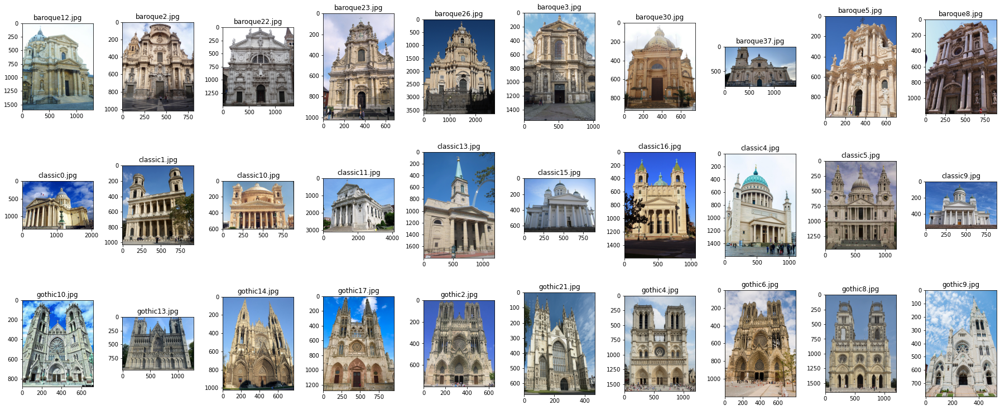

In [ ]:
list_jpgfiles_sample = visualize_sample_images(num_images_to_visualize = 30, 
                                               target_folder = FOLDER_SEEDS,
                                               savefile = "/content/gdrive/My Drive/architecture_fsl/trainingset1.jpg")

### Prepare images metadata

In [ ]:
#sidenote: how it works
print(re.split("[^a-zA-Z]+", "gothic5.jpg"))

print(re.findall(r"[a-zA-Z]+", "gothic5.jpg"))
print(re.findall(r"[a-zA-Z]*", "gothic5.jpg"))

['gothic', 'jpg']
['gothic', 'jpg']
['gothic', '', '', 'jpg', '']


In [ ]:
def identify_seeds_training(folder_training):
    """ searches for jpg files in folder_training and creates a dataframe with their metadata"""

    list_files = glob.glob(folder_training + "/*.jpg")
    df_files = pd.DataFrame({"filepath": list_files})
    df_files["filename"] = df_files["filepath"].apply(lambda x: x.split("/")[-1])

    #use regex to extract class, knowing that the filename has format classNUM.jpg
    df_files["class"] = df_files["filename"].apply(lambda x: re.split("[^a-zA-Z]+", x)[0])

    df_files.sort_values(by = "class", inplace = True)

    return df_files 

In [ ]:
df_files  = identify_seeds_training(folder_training = "/content/gdrive/My Drive/architecture_fsl/seeds")

df_files

,filepath,filename,class
0,/content/gdrive/My Drive/architecture_fsl/seed...,baroque3.jpg,baroque
1,/content/gdrive/My Drive/architecture_fsl/seed...,baroque2.jpg,baroque
2,/content/gdrive/My Drive/architecture_fsl/seed...,baroque5.jpg,baroque
3,/content/gdrive/My Drive/architecture_fsl/seed...,baroque8.jpg,baroque
4,/content/gdrive/My Drive/architecture_fsl/seed...,baroque22.jpg,baroque
5,/content/gdrive/My Drive/architecture_fsl/seed...,baroque23.jpg,baroque
6,/content/gdrive/My Drive/architecture_fsl/seed...,baroque30.jpg,baroque
7,/content/gdrive/My Drive/architecture_fsl/seed...,baroque37.jpg,baroque
8,/content/gdrive/My Drive/architecture_fsl/seed...,baroque12.jpg,baroque
10,/content/gdrive/My Drive/architecture_fsl/seed...,baroque26.jpg,baroque


### Read image

In [ ]:
def get_image(file_path):
    """ read image from specified location, which can be the 
        local filesystem path or a GCP Storage blob URI"""
    with file_io.FileIO(file_path, 'rb') as f:
        im = tf.io.decode_image(f.read())
        #since we're in eager execution mode in TF, we can easily convert tensor to numpy
        im_arr = im.numpy()
    return im, im_arr

In [ ]:
im1_tens, im1_arr = get_image(file_path = FOLDER_SEEDS + "gothic21.jpg")
print("im_tens:".ljust(20), im1_tens.shape, im1_tens.dtype, type(im1_tens))
print("im_arr:".ljust(20), im1_arr.shape, im1_arr.dtype, type(im1_arr))


im_tens:             (672, 468, 3) <dtype: 'uint8'> <class 'tensorflow.python.framework.ops.EagerTensor'>
im_arr:              (672, 468, 3) uint8 <class 'numpy.ndarray'>


------------

## TripletNet Neural Network


The TripletNet Neural Network consists of the following parts:
- 3 inputs, one for each image in a triplet: the anchor $x_a$, positive (same class) example $x_p$, negative (different class) example $x_n$
- a sub-model computing embeddings given an image  - the trainable part : $f(x)$
- the pairwise distance between the embeddings (feature vectors): $D(x_0,x_1) = \left \| f(x_0) - f(x_1) \right \|$  
- a triple loss computed as  
$L(x_a,x_p,x_n,y) = max(0, D(x_a,x_p)^2 - D(x_a, x_n)^2 + margin )$




### Prepare triplets for training

Here we create training triplet made of:
- anchor, positive example and negative example, e.g. gothic, gothic, baroque.


In [ ]:
def generate_triplets(df_files):

    #dict with composite key
    dict_triplet_type = {("baroque", "baroque", "gothic"):  1,
                      ("baroque", "baroque", "classic"): 2,
                      ("classic", "classic", "gothic"):  3,
                      ("classic", "classic", "baroque"): 4,
                      ("gothic", "gothic", "classic"): 5,
                      ("gothic", "gothic", "baroque"):  6
                     }

    df_files_cpy = df_files.copy()
    #add a dummy column to use in merge for making cross-product 
    df_files_cpy["dummycol"] = 1

    df_crossprod = pd.merge(left=df_files_cpy, right=df_files_cpy,
                            left_on = "dummycol", right_on="dummycol", 
                            how="inner", suffixes = ["_a", "_p"])
    
    print(df_crossprod.columns)

    #keep only rows where anchor and positive have same class but non self-pairs
    df_crossprod = df_crossprod[(df_crossprod["class_a"] == df_crossprod["class_p"]) & (df_crossprod["filepath_a"] != df_crossprod["filepath_p"]) ]
    print("***** the cross-product anchor-positive resulted in a dataframe of {} rows".format(df_crossprod.shape[0]))

    df_crossprod_ = pd.merge(left=df_crossprod, right=df_files_cpy,
                            left_on = "dummycol", right_on="dummycol", 
                            how="inner", suffixes = ["", "_n"])
    
    #note: the _n suffix was not added because no column name duplicattes after the merge, so we operate it 
    df_crossprod_.rename(columns = {"filepath" : "filepath_n", "filename": "filename_n", "class":"class_n"}, inplace = True)

    print(df_crossprod_.columns)

    #keep only negative examples to complete the triplet 
    df_crossprod_ = df_crossprod_[df_crossprod_["class_a"] != df_crossprod_["class_n"]]
    print("***** the cross-product anchor-positive-negative resulted in a dataframe of {} rows".format(df_crossprod_.shape[0]))

    df_crossprod_["triplet_type"] = df_crossprod_[["class_a", "class_p", "class_n"]].apply(
                                      lambda x: dict_triplet_type[(x[0],x[1], x[2] )], axis = 1)
    
    return df_crossprod_

In [ ]:
df_seed_triplets = generate_triplets(df_files)
df_seed_triplets.sample(5)

Index(['filepath_a', 'filename_a', 'class_a', 'dummycol', 'filepath_p',
       'filename_p', 'class_p'],
      dtype='object')
***** the cross-product anchor-positive resulted in a dataframe of 270 rows
Index(['filepath_a', 'filename_a', 'class_a', 'dummycol', 'filepath_p',
       'filename_p', 'class_p', 'filepath_n', 'filename_n', 'class_n'],
      dtype='object')
***** the cross-product anchor-positive-negative resulted in a dataframe of 5400 rows


,filepath_a,filename_a,class_a,dummycol,filepath_p,filename_p,class_p,filepath_n,filename_n,class_n,triplet_type
3952,/content/gdrive/My Drive/architecture_fsl/seed...,classic10.jpg,classic,1,/content/gdrive/My Drive/architecture_fsl/seed...,classic5.jpg,classic,/content/gdrive/My Drive/architecture_fsl/seed...,gothic6.jpg,gothic,3
2399,/content/gdrive/My Drive/architecture_fsl/seed...,baroque12.jpg,baroque,1,/content/gdrive/My Drive/architecture_fsl/seed...,baroque37.jpg,baroque,/content/gdrive/My Drive/architecture_fsl/seed...,gothic13.jpg,gothic,1
5594,/content/gdrive/My Drive/architecture_fsl/seed...,gothic2.jpg,gothic,1,/content/gdrive/My Drive/architecture_fsl/seed...,gothic17.jpg,gothic,/content/gdrive/My Drive/architecture_fsl/seed...,classic10.jpg,classic,5
5927,/content/gdrive/My Drive/architecture_fsl/seed...,gothic4.jpg,gothic,1,/content/gdrive/My Drive/architecture_fsl/seed...,gothic13.jpg,gothic,/content/gdrive/My Drive/architecture_fsl/seed...,classic4.jpg,classic,5
3755,/content/gdrive/My Drive/architecture_fsl/seed...,classic15.jpg,classic,1,/content/gdrive/My Drive/architecture_fsl/seed...,classic0.jpg,classic,/content/gdrive/My Drive/architecture_fsl/seed...,baroque23.jpg,baroque,4


In [ ]:
def training_and_validation_triplets(df_seed_triplets):

    #here we split the 5400 seed triplets into 80% for training,  20% for validation, by stratified sampling by triplet-type
    train, valid = train_test_split(df_seed_triplets, test_size=0.2, random_state=0, stratify=df_seed_triplets[['triplet_type']])

    print("training: {} seed triplets".format(train.shape[0]))
    print("validation: {} seed triplets".format(valid.shape[0]))

    list_triplets_training = train[["filepath_a", "filepath_p", "filepath_n", "triplet_type"]].to_dict(orient="records")
    list_triplets_validation = valid[["filepath_a", "filepath_p", "filepath_n", "triplet_type"]].to_dict(orient="records")
    
    return list_triplets_training, list_triplets_validation

In [ ]:
list_triplets_train, list_triplets_valid = training_and_validation_triplets(df_seed_triplets)

training: 4320 seed triplets
validation: 1080 seed triplets


In [ ]:
list_triplets_train[0:10]

[{'filepath_a': '/content/gdrive/My Drive/architecture_fsl/seeds/gothic14.jpg',
  'filepath_n': '/content/gdrive/My Drive/architecture_fsl/seeds/classic13.jpg',
  'filepath_p': '/content/gdrive/My Drive/architecture_fsl/seeds/gothic2.jpg',
  'triplet_type': 5},
 {'filepath_a': '/content/gdrive/My Drive/architecture_fsl/seeds/baroque30.jpg',
  'filepath_n': '/content/gdrive/My Drive/architecture_fsl/seeds/gothic6.jpg',
  'filepath_p': '/content/gdrive/My Drive/architecture_fsl/seeds/baroque22.jpg',
  'triplet_type': 1},
 {'filepath_a': '/content/gdrive/My Drive/architecture_fsl/seeds/baroque8.jpg',
  'filepath_n': '/content/gdrive/My Drive/architecture_fsl/seeds/gothic6.jpg',
  'filepath_p': '/content/gdrive/My Drive/architecture_fsl/seeds/baroque3.jpg',
  'triplet_type': 1},
 {'filepath_a': '/content/gdrive/My Drive/architecture_fsl/seeds/baroque8.jpg',
  'filepath_n': '/content/gdrive/My Drive/architecture_fsl/seeds/classic0.jpg',
  'filepath_p': '/content/gdrive/My Drive/architecture

So, till here we have a list of dicts.

In [ ]:
#save the lists to files

with open('/content/gdrive/My Drive/architecture_fsl/training_triplets.json', 'w') as fout1:
    json.dump(list_triplets_train, fout1)

with open('/content/gdrive/My Drive/architecture_fsl/validation_triplets.json', 'w') as fout2:
    json.dump(list_triplets_valid, fout2)


### TF Dataset 

see docs at https://www.tensorflow.org/api_docs/python/tf/data/Dataset

In [ ]:
#sidenote: how it works

with tf.device('/cpu:0'):
    #create a dataset from a list of dicts
    dataset0 = tf.data.Dataset.from_generator( lambda: list_triplets_train,
                                             {'filepath_a' : tf.string, 
                                              'filepath_p' : tf.string, 
                                              'filepath_n' : tf.string, 
                                              'triplet_type' : tf.int32})

    dataset0 = dataset0.batch(4)
    dataset0 = dataset0.prefetch(1)


iterator0 = dataset0.__iter__() 
pprint.pprint(next(iterator0))
print("---------------------------------------")
pprint.pprint(next(iterator0))


{'filepath_a': <tf.Tensor: shape=(4,), dtype=string, numpy=
array([b'/content/gdrive/My Drive/architecture_fsl/seeds/gothic14.jpg',
       b'/content/gdrive/My Drive/architecture_fsl/seeds/baroque30.jpg',
       b'/content/gdrive/My Drive/architecture_fsl/seeds/baroque8.jpg',
       b'/content/gdrive/My Drive/architecture_fsl/seeds/baroque8.jpg'],
      dtype=object)>,
 'filepath_n': <tf.Tensor: shape=(4,), dtype=string, numpy=
array([b'/content/gdrive/My Drive/architecture_fsl/seeds/classic13.jpg',
       b'/content/gdrive/My Drive/architecture_fsl/seeds/gothic6.jpg',
       b'/content/gdrive/My Drive/architecture_fsl/seeds/gothic6.jpg',
       b'/content/gdrive/My Drive/architecture_fsl/seeds/classic0.jpg'],
      dtype=object)>,
 'filepath_p': <tf.Tensor: shape=(4,), dtype=string, numpy=
array([b'/content/gdrive/My Drive/architecture_fsl/seeds/gothic2.jpg',
       b'/content/gdrive/My Drive/architecture_fsl/seeds/baroque22.jpg',
       b'/content/gdrive/My Drive/architecture_fsl/see

Note: the approach above preserved the dict structure, however the result has tensors as values.

Note: we can't pass a dict to a tf.py_function , so we need to deconstruct it first (see https://github.com/tensorflow/tensorflow/issues/27679)

In [ ]:
def deconstruct(dict_pair):
    """ from a dict where keys aree strings and values are tensors, extract and return only the values(the tensors)"""
    filepath_a = dict_pair["filepath_a"]
    filepath_p = dict_pair["filepath_p"]
    filepath_n = dict_pair["filepath_n"]
    triplet_type = dict_pair["triplet_type"]
    return filepath_a, filepath_p, filepath_n, triplet_type


def make_triplet_images(filepath_a, filepath_p, filepath_n, triplet_type):
    
    #note: if in this order, because EagerTensor extends Tensor -> would exit on that branch
    if isinstance(filepath_a, tf.python.framework.ops.EagerTensor):
        str_filepath_a = filepath_a.numpy().decode('utf-8')
        str_filepath_p = filepath_p.numpy().decode('utf-8')
        str_filepath_n = filepath_n.numpy().decode('utf-8')

        im1_tens, im1_arr = get_image(file_path = str_filepath_a)
        im2_tens, im2_arr = get_image(file_path = str_filepath_p)
        im3_tens, im3_arr = get_image(file_path = str_filepath_n)

        #we can't make batch of images with varying sizes, so we need to resize here to 224 x 224 x 3
        im1_tens_resized = tf.image.resize(im1_tens, size=(224,224), 
                                            method=tf.image.ResizeMethod.BILINEAR, 
                                            preserve_aspect_ratio=False,
                                            antialias=False)
        im2_tens_resized = tf.image.resize(im2_tens, size=(224,224), 
                                            method=tf.image.ResizeMethod.BILINEAR, 
                                            preserve_aspect_ratio=False,
                                            antialias=False)
        im3_tens_resized = tf.image.resize(im3_tens, size=(224,224), 
                                            method=tf.image.ResizeMethod.BILINEAR, 
                                            preserve_aspect_ratio=False,
                                            antialias=False)
        
        im1_tens_cast = tf.cast(im1_tens_resized, dtype=tf.uint8)
        im2_tens_cast = tf.cast(im2_tens_resized, dtype=tf.uint8)
        im3_tens_cast = tf.cast(im3_tens_resized, dtype=tf.uint8)

        #the label won't matter in the loss (which will solely be based on distances)
        triplet_type_int = triplet_type.numpy()
        y_label = {1: 1,  #b,b,g
                   2: 2,  #b,b,c
                   3: 3,  #c,c,g
                   4: 4,  #c,c,b
                   5: 5,  #g,g,c
                   6: 6   #g,g,b
                   }[triplet_type_int]


        return (im1_tens_cast, im2_tens_cast, im3_tens_cast, y_label)
        
    elif isinstance(filepath_a, tf.python.framework.ops.Tensor):
        print("not possible numpy because not eager execution")
        raise Exception("exiting make_pair")


In [ ]:
def create_dataset(list_triplets, batch_size = 1):

    with tf.device('/cpu:0'):
        #create a dataset of the training images
        dataset1 = tf.data.Dataset.from_generator( lambda: list_triplets,
                                                {'filepath_a' : tf.string, 
                                                 'filepath_p' : tf.string, 
                                                 'filepath_n' : tf.string, 
                                                 'triplet_type' : tf.int32})
        
        dataset1 = dataset1.map(lambda d: deconstruct(d), num_parallel_calls=1)

        try:
            dataset1 = dataset1.map(lambda *args: make_triplet_images(args), num_parallel_calls=1)
        except Exception as e:
            print("we need to use tf.py_function instead, which will create EagerPyFunc and work with EagerTensor")
            dataset1 = dataset1.map(lambda *args: tf.py_function(make_triplet_images, 
                                                                inp=args, 
                                                                Tout=(tf.uint8, tf.uint8, tf.uint8, tf.int32)  ), 
                                    num_parallel_calls=1)

        dataset1 = dataset1.batch(batch_size)
        dataset1 = dataset1.prefetch(1)

        return dataset1

In [ ]:
dataset_train = create_dataset(list_triplets_train, batch_size = 8)

dataset_valid = create_dataset(list_triplets_valid, batch_size = 8)


we need to use tf.py_function instead, which will create EagerPyFunc and work with EagerTensor
we need to use tf.py_function instead, which will create EagerPyFunc and work with EagerTensor


In [ ]:
iterator1 = dataset_train.__iter__() 

pair1 = next(iterator1)
print(type(pair1))
print(pair1[0].shape, pair1[0].dtype)
print(pair1[1].shape, pair1[1].dtype)
print(pair1[2].shape, pair1[2].dtype)
print(pair1[3].shape, pair1[3].dtype)

<class 'tuple'>
(8, 224, 224, 3) <dtype: 'uint8'>
(8, 224, 224, 3) <dtype: 'uint8'>
(8, 224, 224, 3) <dtype: 'uint8'>
(8,) <dtype: 'int32'>


In [ ]:
def next_and_view(iterator1):
    pair1 = next(iterator1)
    #show first pair of the batch denoted by pair1
    print(type(pair1[0][0]), pair1[0][0].shape)
    print(type(pair1[1][0]), pair1[1][0].shape)
    print(type(pair1[2][0]), pair1[2][0].shape)
    print(type(pair1[3][0]), pair1[3][0].shape)
    print("-----------------------------------------------")

    fig,ax = plt.subplots(1,3, figsize=(18,5))
    ax[0].imshow(pair1[0][0].numpy())
    ax[1].imshow(pair1[1][0].numpy())
    ax[2].imshow(pair1[2][0].numpy())
    fig.suptitle('y_true = %d'%pair1[3][0], y= 0)
    fig.tight_layout()

    return pair1

<class 'tensorflow.python.framework.ops.EagerTensor'> (224, 224, 3)
<class 'tensorflow.python.framework.ops.EagerTensor'> (224, 224, 3)
<class 'tensorflow.python.framework.ops.EagerTensor'> (224, 224, 3)
<class 'tensorflow.python.framework.ops.EagerTensor'> ()
-----------------------------------------------


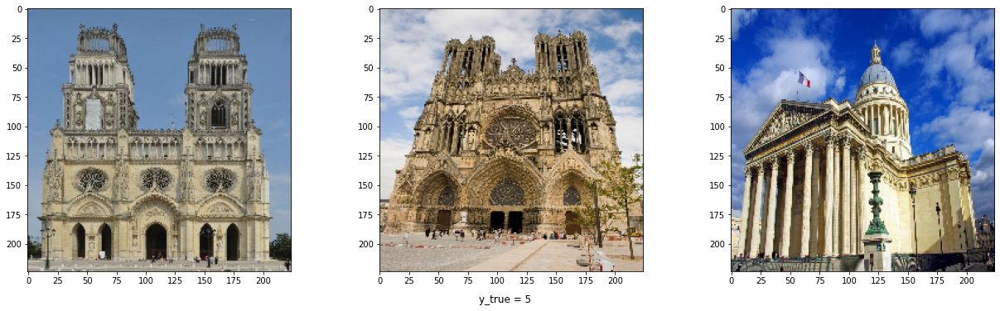

In [ ]:
_ = next_and_view(iterator1)

In [ ]:
#skip some

for ii in range(25):
    pair1 = next(iterator1)

<class 'tensorflow.python.framework.ops.EagerTensor'> (224, 224, 3)
<class 'tensorflow.python.framework.ops.EagerTensor'> (224, 224, 3)
<class 'tensorflow.python.framework.ops.EagerTensor'> (224, 224, 3)
<class 'tensorflow.python.framework.ops.EagerTensor'> ()
-----------------------------------------------


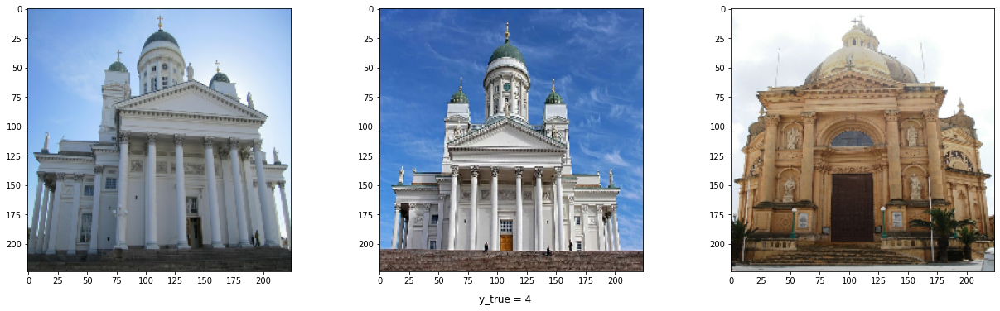

In [ ]:
_ = next_and_view(iterator1)

### The Triplet Net parts 

Here we use the TF Keras functional API in creating the deep learning model.  
For the embedder part (i.e. the  feature vector module), we use a TF Hub module of ResNet V2 50 architecture, pretrained  on dataset ImageNet   
https://tfhub.dev/google/imagenet/resnet_v2_50/feature_vector/4

**Download:** 

In [ ]:
!wget --spider https://tfhub.dev/google/imagenet/resnet_v2_50/feature_vector/4?tf-hub-format=compressed

Spider mode enabled. Check if remote file exists.
--2020-12-06 09:56:00--  https://tfhub.dev/google/imagenet/resnet_v2_50/feature_vector/4?tf-hub-format=compressed
Resolving tfhub.dev (tfhub.dev)... 74.125.195.113, 74.125.195.101, 74.125.195.139, ...
Connecting to tfhub.dev (tfhub.dev)|74.125.195.113|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://storage.googleapis.com/tfhub-modules/google/imagenet/resnet_v2_50/feature_vector/4.tar.gz [following]
Spider mode enabled. Check if remote file exists.
--2020-12-06 09:56:00--  https://storage.googleapis.com/tfhub-modules/google/imagenet/resnet_v2_50/feature_vector/4.tar.gz
Resolving storage.googleapis.com (storage.googleapis.com)... 74.125.142.128, 74.125.195.128, 2607:f8b0:400e:c03::80, ...
Connecting to storage.googleapis.com (storage.googleapis.com)|74.125.142.128|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 87742681 (84M) [application/x-tar]
Remote file exists.



In [ ]:
!mkdir -p /tmp/tfhub_models/resnet50
!curl -L "https://tfhub.dev/google/imagenet/resnet_v2_50/feature_vector/4?tf-hub-format=compressed" | tar -zxvC /tmp/tfhub_models/resnet50

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
  0     0    0     0    0     0      0      0 --:--:-- --:--:-- --:--:--     0
./
./assets/
./saved_model.pb
./variables/
./variables/variables.index
./variables/variables.data-00000-of-00001
100 83.6M  100 83.6M    0     0  51.1M      0  0:00:01  0:00:01 --:--:-- 71.8M


In [ ]:
!tree --du -h  /tmp/tfhub_models

/tmp/tfhub_models
└── [ 91M]  resnet50
    ├── [4.0K]  assets
    ├── [1.4M]  saved_model.pb
    └── [ 90M]  variables
        ├── [ 90M]  variables.data-00000-of-00001
        └── [5.0K]  variables.index

  91M used in 3 directories, 3 files


**Build model:**

In [ ]:
#how it works

t1 = tf.convert_to_tensor(np.array([[2,4,8]], dtype = np.float32))
t2 = tf.convert_to_tensor(np.array([[4,8,16]], dtype = np.float32))

print("t1 = ", t1)
print("t2 = ", t2)
print("-----------------------------------------------------")

t12 = tf.concat([t1,t2], axis = 0)
print("concat:", t12)

print("-----------------------------------------------------")

dif = t12[0] - t12[1]
print("t1-t2 =".ljust(15), dif)

sq = tf.math.square(t12[0])
print("t1**2 = ", sq)

s = tf.reduce_sum(sq)
print("s=", s)

print(tf.math.maximum(1,10))

t1 =  tf.Tensor([[2. 4. 8.]], shape=(1, 3), dtype=float32)
t2 =  tf.Tensor([[ 4.  8. 16.]], shape=(1, 3), dtype=float32)
-----------------------------------------------------
concat: tf.Tensor(
[[ 2.  4.  8.]
 [ 4.  8. 16.]], shape=(2, 3), dtype=float32)
-----------------------------------------------------
t1-t2 =         tf.Tensor([-2. -4. -8.], shape=(3,), dtype=float32)
t1**2 =  tf.Tensor([ 4. 16. 64.], shape=(3,), dtype=float32)
s= tf.Tensor(84.0, shape=(), dtype=float32)
tf.Tensor(10, shape=(), dtype=int32)


In [ ]:
#custom loss
#note: Custom loss function is required to return one loss value per sample.

class MyTripletLoss(tf.keras.losses.Loss):
    def __init__(self, margin, name="tripletloss"):
        super().__init__(name=name)
        self.margin = margin

    def call(self, y_true, y_pred):
        #y_true won't be used, but is required
        y_pred = tf.convert_to_tensor(y_pred)
        #tf.print(y_pred)

        batch_dist_a_p = y_pred[0]
        batch_dist_a_n = y_pred[1]

        dif = tf.math.square(batch_dist_a_p) - tf.math.square(batch_dist_a_n)
        the_loss = tf.reduce_sum(tf.math.maximum(0.0, dif + self.margin))

        return the_loss


In [ ]:
@tf.function
def func_debug_dist(x, tens_name = ""):
    #tf.print("  || func_debug_dist ", tens_name,  " = ", x)
    return x

def build_tripletnet():

    # build a sequential model using the functional API
    tf.keras.backend.clear_session()

    #2 inputs, one for each image in the pair; use None to allow ny input size
    model_input1 = tf.keras.Input(shape=(None, None, 3), dtype=tf.uint8, name = "InputA")
    model_input2 = tf.keras.Input(shape=(None, None, 3), dtype=tf.uint8, name = "InputP")
    model_input3 = tf.keras.Input(shape=(None, None, 3), dtype=tf.uint8, name = "InputN")

    #resize to required size , in a lambda layer
    input1_resized = tf.keras.layers.Lambda(lambda x: tf.image.resize(x, size=(224,224), 
                                                                      method=tf.image.ResizeMethod.BILINEAR, 
                                                                      preserve_aspect_ratio=False,
                                                                      antialias=False),
                                                name = "resize1")(model_input1)
    input2_resized = tf.keras.layers.Lambda(lambda x: tf.image.resize(x, size=(224,224), 
                                                                      method=tf.image.ResizeMethod.BILINEAR, 
                                                                      preserve_aspect_ratio=False,
                                                                      antialias=False),
                                                name = "resize2")(model_input2)
    input3_resized = tf.keras.layers.Lambda(lambda x: tf.image.resize(x, size=(224,224), 
                                                                      method=tf.image.ResizeMethod.BILINEAR, 
                                                                      preserve_aspect_ratio=False,
                                                                      antialias=False),
                                                name = "resize3")(model_input3)


    #the embeddings - start with pretrained ResNet50 
    embedder = hub.KerasLayer("/tmp/tfhub_models/resnet50",
                             trainable = True, arguments=dict(batch_norm_momentum=0.997))
    
    embeddings1 = embedder(input1_resized)
    embeddings2 = embedder(input2_resized)
    embeddings3 = embedder(input3_resized)

    #euclidean distance
    dist_embeddings12 = tf.norm(embeddings1 - embeddings2, ord='euclidean', axis = 1)
    dist_embeddings13 = tf.norm(embeddings1 - embeddings3, ord='euclidean', axis = 1)

    dist_embeddings12_cpy = tf.keras.layers.Lambda(lambda x: func_debug_dist(x, tens_name = "dist_a_p"))(dist_embeddings12)
    dist_embeddings13_cpy = tf.keras.layers.Lambda(lambda x: func_debug_dist(x, tens_name = "dist_a_n"))(dist_embeddings13)

    #expand dims
    dist_embeddings12_ = tf.expand_dims(dist_embeddings12_cpy, axis = 0)
    dist_embeddings13_ = tf.expand_dims(dist_embeddings13_cpy, axis = 0)

    #concatenate the 2 tensors of batch-level distances
    dist_concat = tf.concat([dist_embeddings12_,dist_embeddings13_], axis = 0) 

    #it's not evaluated unless it's on the flow path towards computing outputs
    dist_embeddings_ = tf.keras.layers.Lambda(lambda x: func_debug_dist(x, tens_name = "dist_concat"), name = "debugging")(dist_concat)

    #y_pred is basically the computed euclidean distance between the 2 embeddings
    model_outputs = [dist_embeddings_]

    model = tf.keras.Model(inputs = [model_input1, model_input2, model_input3], 
                           outputs = model_outputs, 
                           name="tripletnet")

    model.compile(loss = MyTripletLoss(margin=10),
                  optimizer = tf.keras.optimizers.Adamax(learning_rate=0.001))
    
    return model



In [ ]:
model_tripletnet = build_tripletnet()
model_tripletnet.summary()

Model: "tripletnet"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
InputA (InputLayer)             [(None, None, None,  0                                            
__________________________________________________________________________________________________
InputP (InputLayer)             [(None, None, None,  0                                            
__________________________________________________________________________________________________
InputN (InputLayer)             [(None, None, None,  0                                            
__________________________________________________________________________________________________
resize1 (Lambda)                (None, 224, 224, 3)  0           InputA[0][0]                     
_________________________________________________________________________________________

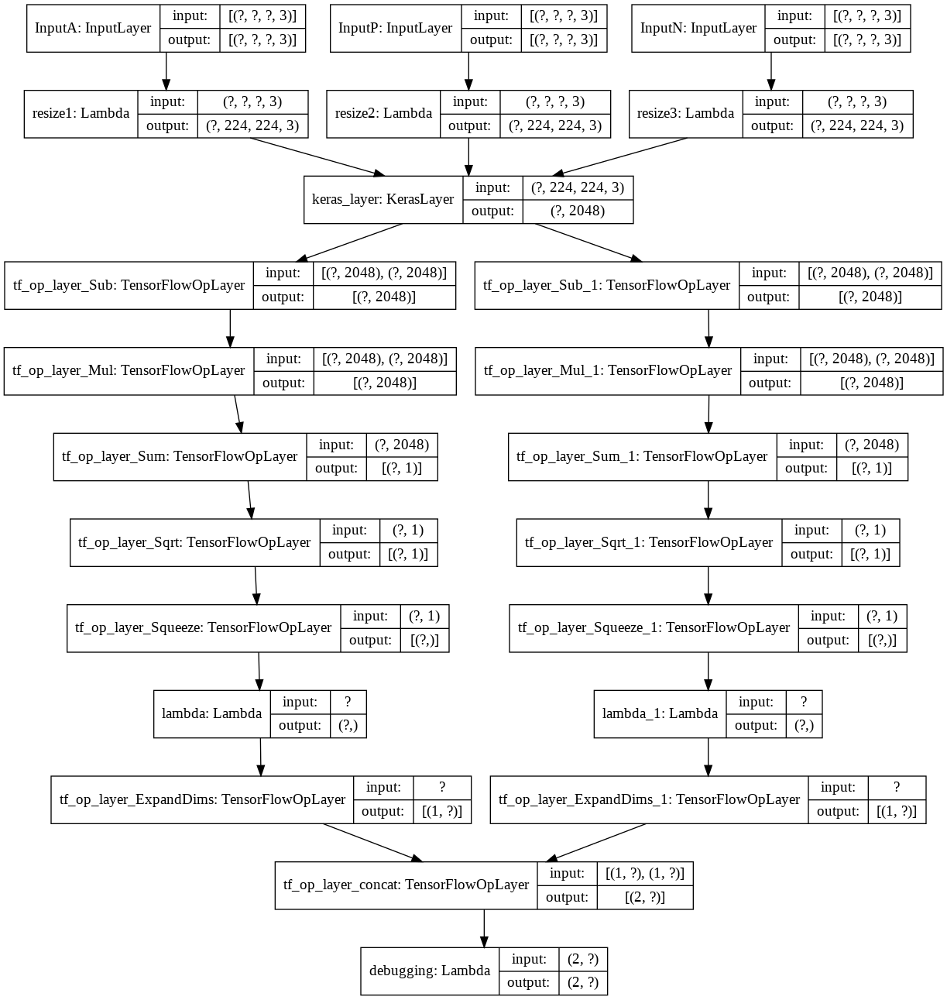

In [ ]:
tf.keras.utils.plot_model(model_tripletnet, show_shapes = True)


In [ ]:
#print layers names and seqno
for i in range(len(model_tripletnet.layers)):
    print(i, model_tripletnet.layers[i].name)

print("--------------------------------------------")

print("prediction at layer:")
print(model_tripletnet.layers[-1].name, " ||| shape:", model_tripletnet.layers[i].output_shape)

0 InputA
1 InputP
2 InputN
3 resize1
4 resize2
5 resize3
6 keras_layer
7 tf_op_layer_Sub
8 tf_op_layer_Sub_1
9 tf_op_layer_Mul
10 tf_op_layer_Mul_1
11 tf_op_layer_Sum
12 tf_op_layer_Sum_1
13 tf_op_layer_Sqrt
14 tf_op_layer_Sqrt_1
15 tf_op_layer_Squeeze
16 tf_op_layer_Squeeze_1
17 lambda
18 lambda_1
19 tf_op_layer_ExpandDims
20 tf_op_layer_ExpandDims_1
21 tf_op_layer_concat
22 debugging
--------------------------------------------
prediction at layer:
debugging  ||| shape: (2, None)


### Prior to fine-tuning, out of the box similarity metric

In [ ]:
#reset iterator

iterator1 = dataset_train.__iter__() 

#consume one
pair1 = next(iterator1)

<class 'tensorflow.python.framework.ops.EagerTensor'> (224, 224, 3)
<class 'tensorflow.python.framework.ops.EagerTensor'> (224, 224, 3)
<class 'tensorflow.python.framework.ops.EagerTensor'> (224, 224, 3)
<class 'tensorflow.python.framework.ops.EagerTensor'> ()
-----------------------------------------------
****** PREDICTION FOR THE ENTIRE BATCH: [[1464.2896 4118.6333 1096.1737 2860.3071 2263.0806 2664.7764 1773.0884
  2554.8948]
 [1647.5846 2276.3784 2881.1033 2813.808  5673.8965 2144.4272 2712.5833
  1980.177 ]]


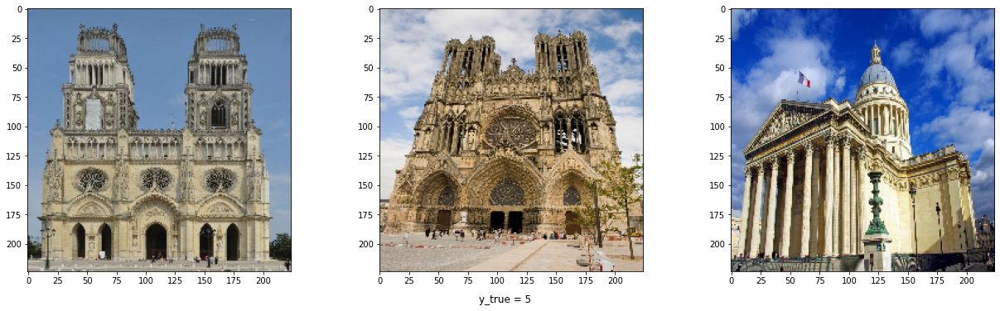

In [ ]:
a_triplet_images = next_and_view(iterator1)

pred_initial = model_tripletnet.predict([a_triplet_images[0], a_triplet_images[1], a_triplet_images[2]])

print("****** PREDICTION FOR THE ENTIRE BATCH:", pred_initial )

Note: we've printed predictions for all 8 triplets in the batch, but we've displayed only first triplet of images in the batch

In [ ]:
#skip some

for ii in range(25):
    pair1 = next(iterator1)

<class 'tensorflow.python.framework.ops.EagerTensor'> (224, 224, 3)
<class 'tensorflow.python.framework.ops.EagerTensor'> (224, 224, 3)
<class 'tensorflow.python.framework.ops.EagerTensor'> (224, 224, 3)
<class 'tensorflow.python.framework.ops.EagerTensor'> ()
-----------------------------------------------
****** PREDICTION FOR THE ENTIRE BATCH: [[2594.9854 2734.0522 2582.2632 1886.0519 1340.0841 2985.8975 1054.3596
  4441.7134]
 [1807.1221 3415.7227 2573.6133 3034.8027 1887.1062 6593.     1906.3401
  2039.7832]]


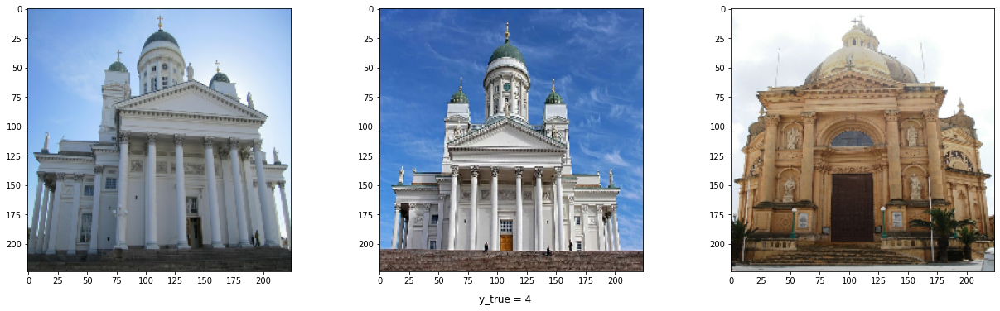

In [ ]:
a_triplet_images = next_and_view(iterator1)

pred_initial = model_tripletnet.predict([a_triplet_images[0], a_triplet_images[1], a_triplet_images[2]])

print("****** PREDICTION FOR THE ENTIRE BATCH:", pred_initial )

Note: we've printed predictions for all 8 triplets in the batch, but we've displayed only first ttripletr of images in the batch

We don't get satisfactory results out-of-the-box, so it needs training, i.e. fine-tuning the embedder part.


### Start training, hence fine-tuning the ResNet50 part of the model

Note: we now want to fit the model to the data, using the prepared dataset1. Now that we know the names of the inputs in the model, we can map the dataset to explicitly set:

In [ ]:
def mappings_to_model(x):
    return {
        'InputA': x[0],
        'InputP': x[1],
        'InputN': x[2],
    }, x[3]
    
    
dataset_train_ = dataset_train.map(lambda *args: mappings_to_model(args), num_parallel_calls=1)
dataset_valid_ = dataset_valid.map(lambda *args: mappings_to_model(args), num_parallel_calls=1)

In [ ]:
!rm -r -f /tmp/checkpoint_model1
!mkdir -p /tmp/checkpoint_model1

In [ ]:
checkpoint_filepath = '/tmp/checkpoint_model1'
checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(
                                filepath=checkpoint_filepath,
                                save_weights_only=False,
                                monitor='val_loss',
                                mode='min',
                                save_best_only=True,
                                verbose=1)

We also write a custom callback

In [ ]:
#recap when it can be triggered

[el for el in dir(tf.keras.callbacks.Callback) if el[0] != "_"]

['on_batch_begin',
 'on_batch_end',
 'on_epoch_begin',
 'on_epoch_end',
 'on_predict_batch_begin',
 'on_predict_batch_end',
 'on_predict_begin',
 'on_predict_end',
 'on_test_batch_begin',
 'on_test_batch_end',
 'on_test_begin',
 'on_test_end',
 'on_train_batch_begin',
 'on_train_batch_end',
 'on_train_begin',
 'on_train_end',
 'set_model',
 'set_params']

In [ ]:
#recap
list_triplets_train[10]

{'filepath_a': '/content/gdrive/My Drive/architecture_fsl/seeds/gothic21.jpg',
 'filepath_n': '/content/gdrive/My Drive/architecture_fsl/seeds/classic10.jpg',
 'filepath_p': '/content/gdrive/My Drive/architecture_fsl/seeds/gothic2.jpg',
 'triplet_type': 5}

In [ ]:
#custom callback to follow the evolution of distance between specific triplets of seed images

class progressCallback(tf.keras.callbacks.Callback):

    def __init__(self, list_triplets_tracked):
        super().__init__()
        self.list_triplets_tracked = list_triplets_tracked
        self.dict_images_triplets_tracked = {}

        for triplet_tracked_id in self.list_triplets_tracked:
            pprint.pprint(triplet_tracked_id)
            triplet_tracked = list_triplets_train[triplet_tracked_id]
            pprint.pprint(triplet_tracked)
            im1_tens, im1_arr = get_image(file_path = triplet_tracked["filepath_a"])
            im1_tens_batch = tf.expand_dims(im1_tens, 0)
            print(im1_tens.shape, " ===> ", im1_tens_batch.shape)
            im2_tens, im2_arr = get_image(file_path = triplet_tracked["filepath_p"])
            im2_tens_batch = tf.expand_dims(im2_tens, 0)
            print(im2_tens.shape, " ===> ", im2_tens_batch.shape)
            im3_tens, im3_arr = get_image(file_path = triplet_tracked["filepath_n"])
            im3_tens_batch = tf.expand_dims(im3_tens, 0)
            print(im3_tens.shape, " ===> ", im3_tens_batch.shape)
            self.dict_images_triplets_tracked[triplet_tracked_id] = [im1_tens_batch, im2_tens_batch, im3_tens_batch]
            print("----------------------------------------------------------------")


    def on_epoch_end(self, epoch, logs={}):
        for triplet_tracked_id in self.list_triplets_tracked:
            #run prediction 
            pred_tracked_triplet = self.model.predict(self.dict_images_triplets_tracked[triplet_tracked_id])
            print("   ||| Trackked pair {}  |||  Prediction: {}  ".format(triplet_tracked_id, pred_tracked_triplet))



my_progress_callback = progressCallback(list_triplets_tracked = [10, 70, 100, 140, 220, 270])
    

10
{'filepath_a': '/content/gdrive/My Drive/architecture_fsl/seeds/gothic21.jpg',
 'filepath_n': '/content/gdrive/My Drive/architecture_fsl/seeds/classic10.jpg',
 'filepath_p': '/content/gdrive/My Drive/architecture_fsl/seeds/gothic2.jpg',
 'triplet_type': 5}
(672, 468, 3)  ===>  (1, 672, 468, 3)
(800, 653, 3)  ===>  (1, 800, 653, 3)
(603, 885, 3)  ===>  (1, 603, 885, 3)
----------------------------------------------------------------
70
{'filepath_a': '/content/gdrive/My Drive/architecture_fsl/seeds/gothic14.jpg',
 'filepath_n': '/content/gdrive/My Drive/architecture_fsl/seeds/baroque30.jpg',
 'filepath_p': '/content/gdrive/My Drive/architecture_fsl/seeds/gothic21.jpg',
 'triplet_type': 6}
(1024, 777, 3)  ===>  (1, 1024, 777, 3)
(672, 468, 3)  ===>  (1, 672, 468, 3)
(931, 754, 3)  ===>  (1, 931, 754, 3)
----------------------------------------------------------------
100
{'filepath_a': '/content/gdrive/My Drive/architecture_fsl/seeds/classic11.jpg',
 'filepath_n': '/content/gdrive/My 

In [ ]:
hist = model_tripletnet.fit( dataset_train_, 
                             validation_data = dataset_valid_,
                             epochs = 3, 
                             shuffle = False, 
                             workers = 1,
                             verbose=1,
                             callbacks = [my_progress_callback, checkpoint_callback]
                            )

Epoch 1/3
    540/Unknown - 484s 896ms/step - loss: 15.9123   ||| Trackked pair 10  |||  Prediction: [[ 3.5356138]
 [12.396773 ]]  
   ||| Trackked pair 70  |||  Prediction: [[ 3.2783885]
 [10.123423 ]]  
   ||| Trackked pair 100  |||  Prediction: [[ 3.4560041]
 [11.302502 ]]  
   ||| Trackked pair 140  |||  Prediction: [[ 2.5118709]
 [10.633377 ]]  
   ||| Trackked pair 220  |||  Prediction: [[ 2.928534]
 [10.642245]]  
   ||| Trackked pair 270  |||  Prediction: [[ 2.889127]
 [10.123423]]  

Epoch 00001: val_loss improved from inf to 0.26754, saving model to /tmp/checkpoint_model1
540/540 [==============================] - 597s 1s/step - loss: 15.9123 - val_loss: 0.2675
Epoch 2/3
540/540 [==============================] - ETA: 0s - loss: 0.4771   ||| Trackked pair 10  |||  Prediction: [[ 3.7623353]
 [12.495161 ]]  
   ||| Trackked pair 70  |||  Prediction: [[ 4.0434847]
 [10.251369 ]]  
   ||| Trackked pair 100  |||  Prediction: [[ 3.467082]
 [14.02946 ]]  
   ||| Trackked pair 140  |

In [ ]:
print(hist.history.keys())

dict_keys(['loss', 'val_loss'])


Text(0.5, 0, 'epoch')

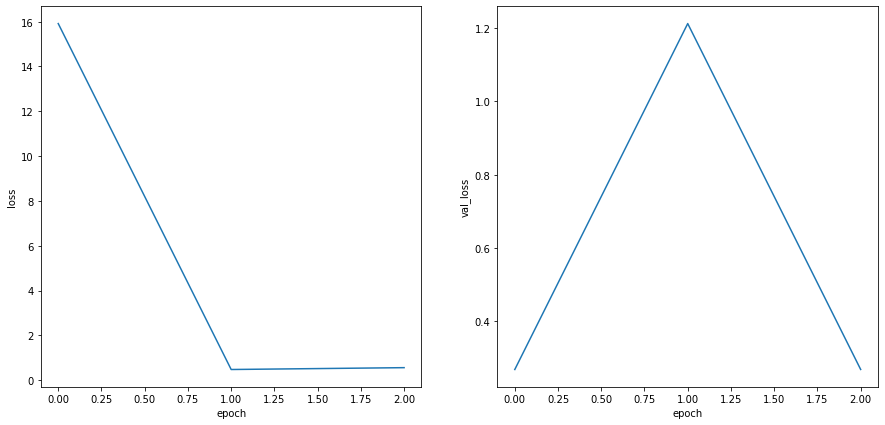

In [ ]:
#plot the evolution of loss and val_loss
fig, ax = plt.subplots(1, 2, figsize = (15, 7))
ax[0].plot(hist.history['loss'])
ax[1].plot(hist.history['val_loss'])

ax[0].set_ylabel('loss')
ax[0].set_xlabel('epoch')

ax[1].set_ylabel('val_loss')
ax[1].set_xlabel('epoch')

Note: we see how loss evolved along the training epochs, for the training set and for the validation set 

### Load the best iteration model and make predictions

In [ ]:
!tree --du -h /tmp/checkpoint_model1

/tmp/checkpoint_model1
├── [4.0K]  assets
├── [3.6M]  saved_model.pb
└── [270M]  variables
    ├── [270M]  variables.data-00000-of-00001
    └── [ 45K]  variables.index

 273M used in 2 directories, 3 files


In [ ]:
!mkdir -p "/content/gdrive/My Drive/architecture_fsl/tn"
!cp -r /tmp/checkpoint_model1 "/content/gdrive/My Drive/architecture_fsl/tn"

In [ ]:
!tree --du -h "/content/gdrive/My Drive/architecture_fsl/tn/checkpoint_model1/"

/content/gdrive/My Drive/architecture_fsl/tn/checkpoint_model1/
├── [4.0K]  assets
├── [3.6M]  saved_model.pb
└── [270M]  variables
    ├── [270M]  variables.data-00000-of-00001
    └── [ 45K]  variables.index

 273M used in 2 directories, 3 files


Note: since we used a custom loss, we reload model as follows:

see issue https://github.com/tensorflow/tensorflow/issues/31850#issuecomment-578566637

In [ ]:
cust_loss = MyTripletLoss(margin=10)

loaded_model_tripletnet = tf.keras.models.load_model("/tmp/checkpoint_model1",
                                                     custom_objects={'MyTripletLoss': cust_loss},
                                                     compile=False)

In [ ]:
type(loaded_model_tripletnet)

tensorflow.python.keras.engine.functional.Functional

**INSPECT THE MODEL'S INPUTS AND OUTUTS**

In [ ]:
loaded_model_tripletnet.signatures

_SignatureMap({'serving_default': <ConcreteFunction signature_wrapper(InputA, InputN, InputP) at 0x7FE6606D4710>})

In [ ]:
loaded_model_tripletnet_func = loaded_model_tripletnet.signatures["serving_default"]

print(type(loaded_model_tripletnet_func))

print("========================================================================")

#we can see here as well the input(s) and output(s)  of the saved model
print("INPUTS:")
print("===========")
#pprint.pprint(loaded_model_tripletnet_func.inputs)
pprint.pprint(loaded_model_tripletnet_func.structured_input_signature)
print("-----------------------------------------------------------------")
print("OUTPUTS:")
print("===========")
pprint.pprint(loaded_model_tripletnet_func.outputs)
pprint.pprint(loaded_model_tripletnet_func.structured_outputs)

<class 'tensorflow.python.saved_model.load._WrapperFunction'>
INPUTS:
((),
 {'InputA': TensorSpec(shape=(None, None, None, 3), dtype=tf.uint8, name='InputA'),
  'InputN': TensorSpec(shape=(None, None, None, 3), dtype=tf.uint8, name='InputN'),
  'InputP': TensorSpec(shape=(None, None, None, 3), dtype=tf.uint8, name='InputP')})
-----------------------------------------------------------------
OUTPUTS:
[<tf.Tensor 'Identity:0' shape=(2, None) dtype=float32>]
{'debugging': TensorSpec(shape=(2, None), dtype=tf.float32, name='debugging')}


**INFERENCE ON PAIRS FROM THE TRAINING SET**

In [ ]:
#reset iterator to the beginning of the dataset_train

iterator1 = dataset_train.__iter__() 


<class 'tensorflow.python.framework.ops.EagerTensor'> (224, 224, 3)
<class 'tensorflow.python.framework.ops.EagerTensor'> (224, 224, 3)
<class 'tensorflow.python.framework.ops.EagerTensor'> (224, 224, 3)
<class 'tensorflow.python.framework.ops.EagerTensor'> ()
-----------------------------------------------
****** PREDICTION FOR THE ENTIRE BATCH: [[ 2.5706105  4.6154594  3.6359699  4.353473   3.229826   3.565832
   3.2712178  4.7459755]
 [10.420645   9.291451  10.243866  12.242483  10.403046  10.046581
  11.311465  12.405295 ]]


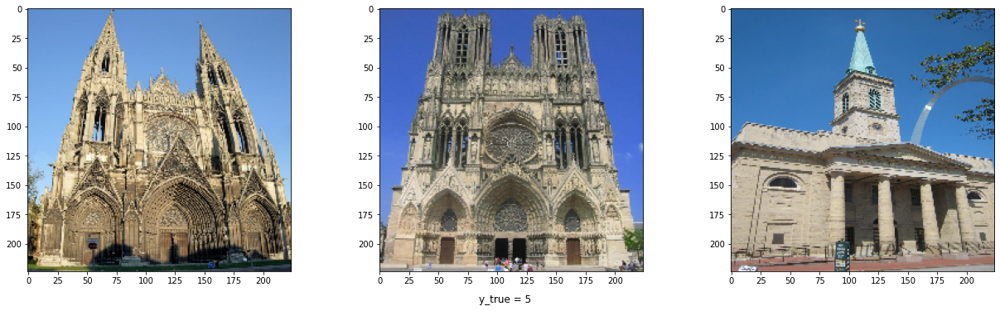

In [ ]:
a_triplet_images = next_and_view(iterator1)

pred_initial = loaded_model_tripletnet.predict([a_triplet_images[0], a_triplet_images[1], a_triplet_images[2]])

print("****** PREDICTION FOR THE ENTIRE BATCH:", pred_initial )

In [ ]:
#alternatively, we could have called
pred_finetuned = loaded_model_tripletnet_func(InputA = a_triplet_images[0], 
                                              InputP = a_triplet_images[1],
                                              InputN = a_triplet_images[2] )
print("****** PREDICTION FOR THE ENTIRE BATCH:", pred_finetuned["debugging"] )

****** PREDICTION FOR THE ENTIRE BATCH: tf.Tensor(
[[ 2.5706105  4.6154594  3.6359699  4.353473   3.229826   3.565832
   3.2712178  4.7459755]
 [10.420645   9.291451  10.243866  12.242483  10.403046  10.046581
  11.311465  12.405295 ]], shape=(2, 8), dtype=float32)


Note the different result obtained with the loaded model from the best epoch, compared to what the model would give after all epochs:

In [ ]:
pred_finetuned = model_tripletnet.predict([a_triplet_images[0], a_triplet_images[1], a_triplet_images[2]])

print("****** PREDICTION FOR THE ENTIRE BATCH:", pred_finetuned )

****** PREDICTION FOR THE ENTIRE BATCH: [[ 3.6777265  3.339805   4.5558267  2.7022178  2.7906823  3.281944
   5.4224234  4.408652 ]
 [ 8.537604   8.12233    8.818212  10.085021   8.374819   8.908881
  10.6774845 10.87462  ]]


## Visualize embeddings from fine-tuned ResNet50

We need to extract tensor from intermediate layer:

In [ ]:
help(loaded_model_tripletnet.get_layer)

Help on method get_layer in module tensorflow.python.keras.engine.training:

get_layer(name=None, index=None) method of tensorflow.python.keras.engine.functional.Functional instance
    Retrieves a layer based on either its name (unique) or index.
    
    If `name` and `index` are both provided, `index` will take precedence.
    Indices are based on order of horizontal graph traversal (bottom-up).
    
    Arguments:
        name: String, name of layer.
        index: Integer, index of layer.
    
    Returns:
        A layer instance.
    
    Raises:
        ValueError: In case of invalid layer name or index.



In [ ]:
layer_intermed = loaded_model_tripletnet.get_layer(name="keras_layer")

embeddings_extractor = tf.keras.models.Model(inputs = loaded_model_tripletnet.inputs[0],
                                             outputs = layer_intermed.output)

**ILLUSTRATE ON ONE IMAGE**

In [ ]:
#read image and wrap it into a batch of one image
im1_tens, im1_arr = get_image(file_path = FOLDER_IMAGES + "baroque7.jpg")
im1_tens_batch = tf.expand_dims(im1_tens, 0)
print(im1_tens.shape, " ===> ", im1_tens_batch.shape)


embeddings_image =  embeddings_extractor(im1_tens_batch)
embeddings_image.shape

(898, 1269, 3)  ===>  (1, 898, 1269, 3)


TensorShape([1, 2048])

Ok, so we've got the features vector of size 2048 as expected

**DO FOR ALL 30 CLASSES SEEDS IMAGES**

In [ ]:
dict_embedd = {}

for i,row in df_files.iterrows():
    filepath_seed = row["filepath"]
    im2_tens, im2_arr = get_image(file_path = filepath_seed)
    im2_tens_batch = tf.expand_dims(im2_tens, 0)

    embeddings_image =  embeddings_extractor(im2_tens_batch)
    dict_embedd[row["filepath"]] = embeddings_image

**REDUCE DIMENSIONALITY FROM 2048 TO 2**

In [ ]:
#we use spread to introduce some jitter, otherwise they'd overlap completely in the 3 clusters
reducer = umap.UMAP(init="random",n_components=2,spread=10.0)

In [ ]:
#stack all embeddings

arr_embeddings = None

for k,v in dict_embedd.items():
    if arr_embeddings is None:
        arr_embeddings = v.numpy().copy()
    else:
        arr_embeddings = np.vstack([arr_embeddings, v.numpy().copy()])

#should have shape (30, 2048)
arr_embeddings.shape

(30, 2048)

In [ ]:
embedding_2d = reducer.fit_transform(arr_embeddings)
embedding_2d.shape

/usr/local/lib/python3.6/dist-packages/umap/umap_.py:1158: RuntimeWarning: divide by zero encountered in power
  return 1.0 / (1.0 + a * x ** (2 * b))


(30, 2)

**PLOT MINI-IMAGES IN THE 2D SPACE**

In [ ]:
xs = embedding_2d[:,0]
ys = embedding_2d[:,1]

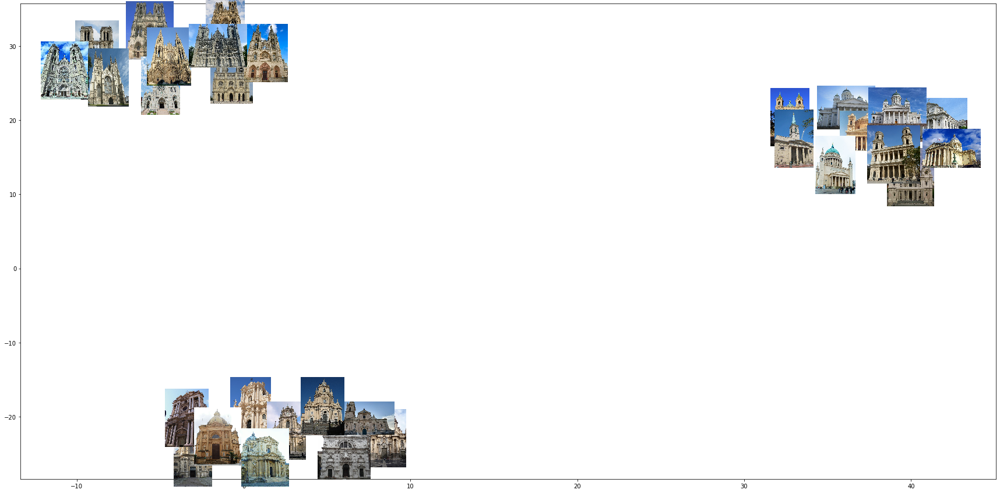

In [ ]:
fig,ax = plt.subplots(1,1, figsize = (30,15))

for i, k in enumerate(list(dict_embedd.keys())):
    filepath_seed = k
    im2_tens, im2_arr = get_image(file_path = filepath_seed)
    #adaptive zoom
    zoom_level = 100 / max(im2_arr.shape[0], im2_arr.shape[1])

    ab = AnnotationBbox(OffsetImage(im2_arr, zoom = zoom_level), (xs[i], ys[i]), frameon=False)
    ax.add_artist(ab)

#also pin the exact position in 2d
ax.scatter(x = xs, y = ys, s=500, color="red")

#ax.set_ylim(-1,2)

We can observe which classes seeds are farther from the rest of their class representatives.

## Embeddings and KNN on test images

### Build an Annoy index with the embeddings of the seeds

In [ ]:
help(AnnoyIndex.__init__)

Help on wrapper_descriptor:

__init__(self, /, *args, **kwargs)
    Initialize self.  See help(type(self)) for accurate signature.



In [ ]:
%%time

annoy_index = AnnoyIndex(2048, metric="euclidean")

list_order = []
ii = 0

for k,v in dict_embedd.items():
    #since v.shape = (1,2048), take v[0]
    annoy_index.add_item(ii, v[0])
    list_order.append(k)
    ii += 1


annoy_index.build(2) # 2 trees
annoy_index.save("/tmp/annoy_idx_tripletnet_embedd.ann")


CPU times: user 20.4 s, sys: 2.68 s, total: 23.1 s
Wall time: 17.6 s


In [ ]:
!du -h "/tmp/annoy_idx_tripletnet_embedd.ann"

276K	/tmp/annoy_idx_tripletnet_embedd.ann


In [ ]:
%%time
annoy_index_restored = AnnoyIndex(2048, metric="euclidean")
annoy_index_restored.load("/tmp/annoy_idx_tripletnet_embedd.ann") # super fast, will just mmap the file

CPU times: user 42 µs, sys: 6 µs, total: 48 µs
Wall time: 56.7 µs


In [ ]:
annoy_index_restored.get_n_items()

30

### Query the index for a test image's embeddings

In [ ]:
#read image and wrap it into a batch of one image
im1_tens, im1_arr = get_image(file_path = FOLDER_IMAGES + "baroque9.jpg")
im1_tens_batch = tf.expand_dims(im1_tens, 0)
print(im1_tens.shape, " ===> ", im1_tens_batch.shape)


embeddings_image =  embeddings_extractor(im1_tens_batch)
embeddings_image.shape

(3000, 2292, 3)  ===>  (1, 3000, 2292, 3)


TensorShape([1, 2048])

In [ ]:
#since embeddings_image.shape = (1,2048), take embeddings_image[0]
results = annoy_index_restored.get_nns_by_vector(embeddings_image[0], n=10, search_k=-1, include_distances=True)
#results is a tuple of (list_indices_images_similar, corresponding_distances)
results

([9, 1, 7, 4, 8, 5, 0, 6, 2, 3],
 [3.2414000034332275,
  3.2629148960113525,
  3.7065646648406982,
  3.9077084064483643,
  4.436723232269287,
  4.624366283416748,
  4.860812187194824,
  5.056467056274414,
  6.109330654144287,
  6.696441173553467])

In [ ]:
def test_image_vs_seeds(test_img_filepath):

    list_results = []
    num_seeds = annoy_index_restored.get_n_items()

    #read image and wrap it into a batch of one image
    im1_tens, im1_arr = get_image(file_path = test_img_filepath)
    im1_tens_batch = tf.expand_dims(im1_tens, 0)
    print(im1_tens.shape, " ===> ", im1_tens_batch.shape)

    embeddings_image =  embeddings_extractor(im1_tens_batch)

    #query annoy index
    results = annoy_index_restored.get_nns_by_vector(embeddings_image[0], n=num_seeds, search_k=-1, include_distances=True)

    for ii in range(num_seeds):    
        seed_near = results[0][ii]
        dist = results[1][ii]

        list_results.append({"seed": list_order[seed_near], "predicted_dist": dist})

    return list_results

In [ ]:
list_results = test_image_vs_seeds(test_img_filepath = FOLDER_IMAGES + "baroque9.jpg")
print("--------------------------------------------------")
#example of an item
list_results[0]

(3000, 2292, 3)  ===>  (1, 3000, 2292, 3)
--------------------------------------------------


{'predicted_dist': 3.2414000034332275,
 'seed': '/content/gdrive/My Drive/architecture_fsl/seeds/baroque26.jpg'}

In [ ]:
def view_nearest_matches(test_img_filepath, topn = 5):

    list_results = test_image_vs_seeds(test_img_filepath = test_img_filepath)

    list_results_sorted = sorted(list_results, key = lambda x: x["predicted_dist"], reverse = False)

    fig, ax = plt.subplots(1, topn + 1, figsize = (30, 5))

    im1_tens, im1_arr = get_image(file_path = test_img_filepath)
    ax[0].imshow(im1_arr)
    ax[0].set_title("test image")

    for ii in range(topn):
        im2_tens, im2_arr = get_image(file_path = list_results_sorted[ii]["seed"])
        ax[ii + 1].imshow(im2_arr)
        filename = list_results_sorted[ii]["seed"].split("/")[-1]
        ax[ii + 1].set_title("%s (%.3f)"%(filename, round(list_results_sorted[ii]["predicted_dist"],3)))

    return list_results_sorted

----------------------
**BAROQUE**

(3000, 2292, 3)  ===>  (1, 3000, 2292, 3)


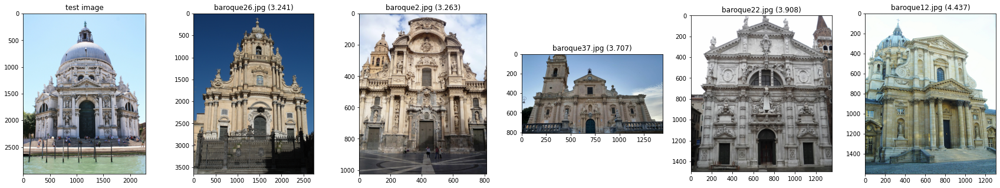

In [ ]:
list_results_sorted = view_nearest_matches(test_img_filepath = FOLDER_IMAGES + "baroque9.jpg")

Note: 5/5 baroque as the test image

**ANOTHER ILLUSTRATION**

(1604, 1200, 3)  ===>  (1, 1604, 1200, 3)


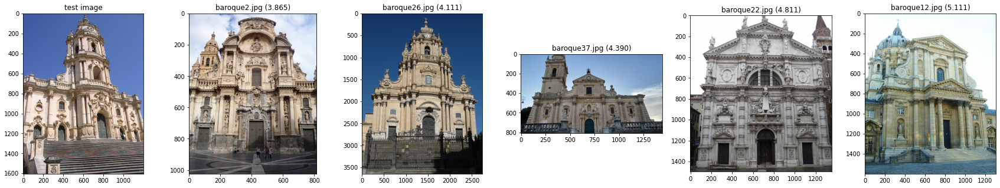

In [ ]:
list_results_sorted = view_nearest_matches(test_img_filepath = FOLDER_IMAGES + "baroque32.jpg")

Note: 5/5 baroque as the test image 

**ANOTHER ILLUSTRATION**

(1067, 800, 3)  ===>  (1, 1067, 800, 3)


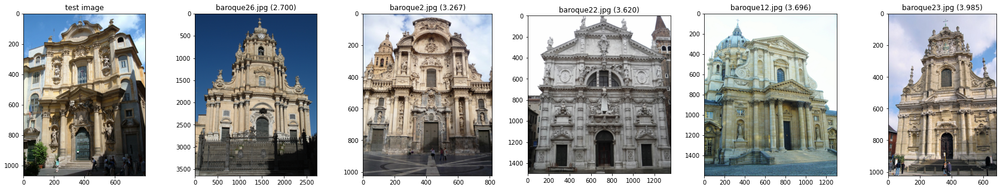

In [ ]:
list_results_sorted = view_nearest_matches(test_img_filepath = FOLDER_IMAGES + "baroque14.jpg")

Note: 5/5 baroque as the test image

**ANOTHER ILLUSTRATION**

(676, 720, 3)  ===>  (1, 676, 720, 3)


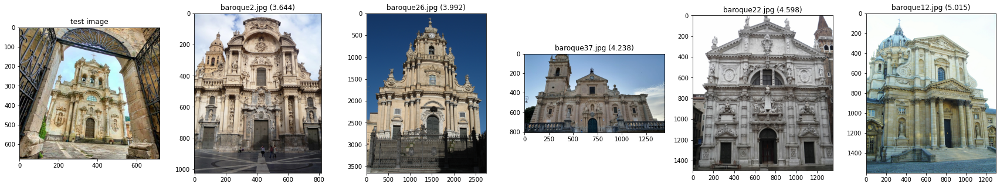

In [ ]:
list_results_sorted = view_nearest_matches(test_img_filepath = FOLDER_IMAGES + "baroque40.jpg")

Note: 5/5 baroque as the test image

**ANOTHER ILLUSTRATION**

(1793, 1425, 3)  ===>  (1, 1793, 1425, 3)


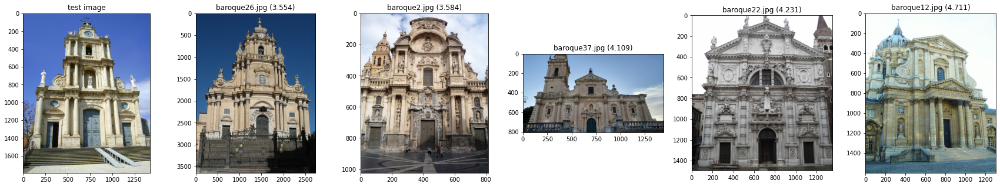

In [ ]:
list_results_sorted = view_nearest_matches(test_img_filepath = FOLDER_IMAGES + "baroque36.jpg")

Note: 5/5 baroque as the test image

-------------------------------------
**GOTHIC**

**ANOTHER ILLUSTRATION**

(2048, 1536, 3)  ===>  (1, 2048, 1536, 3)


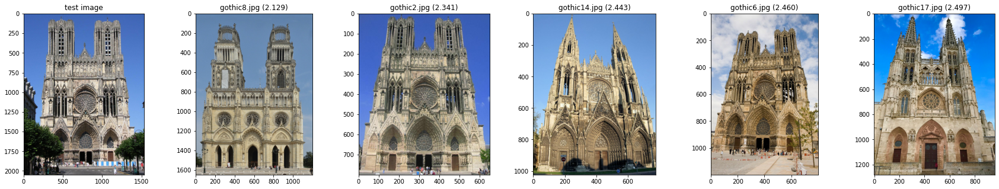

In [ ]:
list_results_sorted = view_nearest_matches(test_img_filepath = FOLDER_IMAGES + "gothic20.jpg")

Note; 5/5 gothic as the test image

**ANOTHER ILLUSTRATION**

(1632, 1224, 3)  ===>  (1, 1632, 1224, 3)


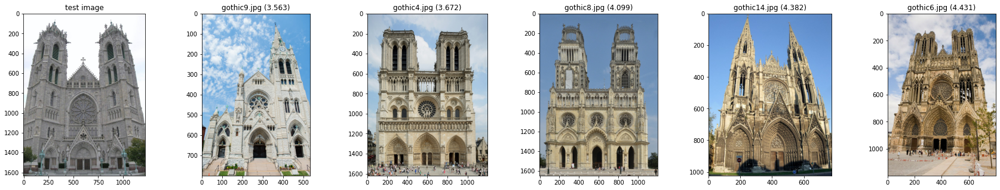

In [ ]:
list_results_sorted = view_nearest_matches(test_img_filepath = FOLDER_IMAGES + "gothic11.jpg")

Note: 5/5 gothic as the test image

**ANOTHER ILLUSTRATION**

(1533, 1533, 3)  ===>  (1, 1533, 1533, 3)


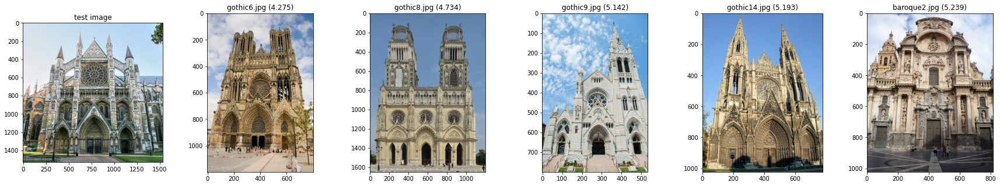

In [ ]:
list_results_sorted = view_nearest_matches(test_img_filepath = FOLDER_IMAGES + "gothic5.jpg")

Note: 4/5 gothic as the test image

**ANOTHER ILLUSTRATION**

(2048, 1333, 3)  ===>  (1, 2048, 1333, 3)


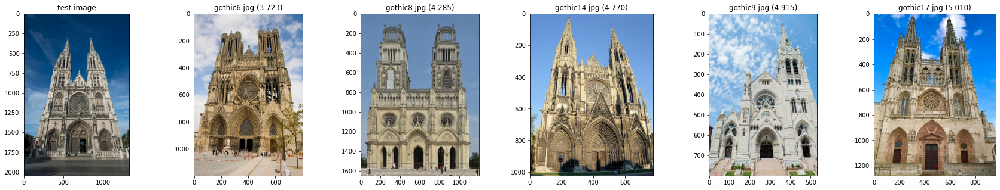

In [ ]:
list_results_sorted = view_nearest_matches(test_img_filepath = FOLDER_IMAGES + "gothic16.jpg")

Note: 5/5 gothic as the test image

**ANOTHER ILLUSTRATION**

(2112, 2816, 3)  ===>  (1, 2112, 2816, 3)


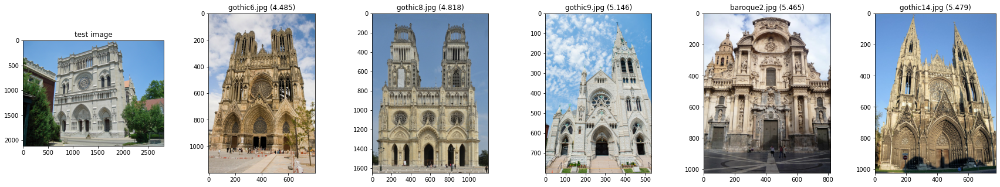

In [ ]:
list_results_sorted = view_nearest_matches(test_img_filepath = FOLDER_IMAGES + "gothic18.jpg")

Note: 4/5 gothic as the test image

----------------------------
**CLASSIC**

**ANOTHER ILLUSTRATION**

(960, 1280, 3)  ===>  (1, 960, 1280, 3)


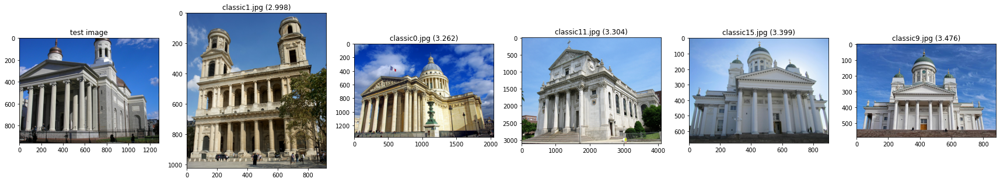

In [ ]:
list_results_sorted = view_nearest_matches(test_img_filepath = FOLDER_IMAGES + "classic3.jpg")

Note: 5/5 classic as the test image

**ANOTHER ILLUSTRATION**

(1200, 900, 3)  ===>  (1, 1200, 900, 3)


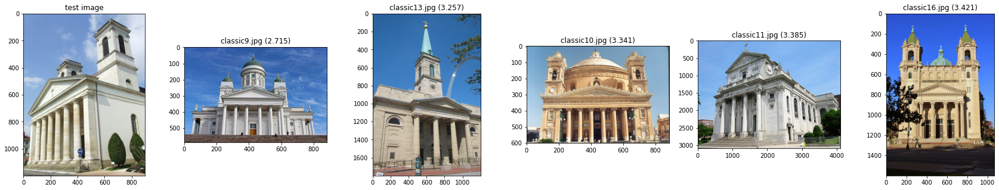

In [ ]:
list_results_sorted = view_nearest_matches(test_img_filepath = FOLDER_IMAGES + "classic12.jpg")

Note: 5/5 classic as the test image

**ANOTHER ILLUSTRATION**

(800, 532, 3)  ===>  (1, 800, 532, 3)


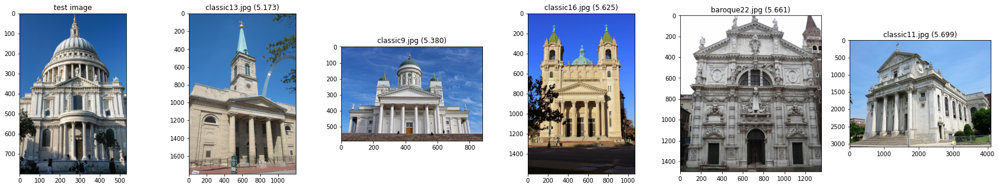

In [ ]:
list_results_sorted = view_nearest_matches(test_img_filepath = FOLDER_IMAGES + "classic2.jpg")

Note: 4/5 classic as the test image

**ANOTHER ILLUSTRATION**

(1976, 1316, 3)  ===>  (1, 1976, 1316, 3)


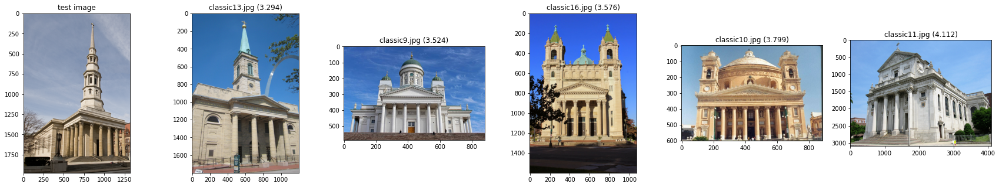

In [ ]:
list_results_sorted = view_nearest_matches(test_img_filepath = FOLDER_IMAGES + "classic14.jpg")

Note: 5/5 classic as the test image

It generalizes well. 

----------------------

### Inference results for all pairs of seeds

In [ ]:
list_results = []

for ii,row1 in df_files.iterrows():
    filepath_seed = row1["filepath"]
    res_knn = test_image_vs_seeds(test_img_filepath = filepath_seed)
    _ = [el.update({'seed_ref': filepath_seed}) for el in res_knn]
    list_results.extend(res_knn)



(1553, 1024, 3)  ===>  (1, 1553, 1024, 3)
(1024, 815, 3)  ===>  (1, 1024, 815, 3)
(1000, 700, 3)  ===>  (1, 1000, 700, 3)
(1200, 900, 3)  ===>  (1, 1200, 900, 3)
(1500, 1353, 3)  ===>  (1, 1500, 1353, 3)
(1024, 682, 3)  ===>  (1, 1024, 682, 3)
(931, 754, 3)  ===>  (1, 931, 754, 3)
(810, 1440, 3)  ===>  (1, 810, 1440, 3)
(1600, 1306, 3)  ===>  (1, 1600, 1306, 3)
(3648, 2736, 3)  ===>  (1, 3648, 2736, 3)
(1600, 1066, 3)  ===>  (1, 1600, 1066, 3)
(3098, 4092, 3)  ===>  (1, 3098, 4092, 3)
(1800, 1200, 3)  ===>  (1, 1800, 1200, 3)
(675, 900, 3)  ===>  (1, 675, 900, 3)
(603, 885, 3)  ===>  (1, 603, 885, 3)
(586, 880, 3)  ===>  (1, 586, 880, 3)
(1465, 1181, 3)  ===>  (1, 1465, 1181, 3)
(1600, 1103, 3)  ===>  (1, 1600, 1103, 3)
(1024, 922, 3)  ===>  (1, 1024, 922, 3)
(1371, 2048, 3)  ===>  (1, 1371, 2048, 3)
(800, 653, 3)  ===>  (1, 800, 653, 3)
(1620, 1200, 3)  ===>  (1, 1620, 1200, 3)
(1200, 800, 3)  ===>  (1, 1200, 800, 3)
(1650, 1200, 3)  ===>  (1, 1650, 1200, 3)
(800, 533, 3)  ===>  (1, 8

In [ ]:
df_seed_vs_seed = pd.DataFrame(list_results)
df_seed_vs_seed.head(10)

,seed,predicted_dist,seed_ref
0,/content/gdrive/My Drive/architecture_fsl/seed...,0.000000,/content/gdrive/My Drive/architecture_fsl/seed...
1,/content/gdrive/My Drive/architecture_fsl/seed...,2.885284,/content/gdrive/My Drive/architecture_fsl/seed...
2,/content/gdrive/My Drive/architecture_fsl/seed...,2.889127,/content/gdrive/My Drive/architecture_fsl/seed...
3,/content/gdrive/My Drive/architecture_fsl/seed...,3.597064,/content/gdrive/My Drive/architecture_fsl/seed...
4,/content/gdrive/My Drive/architecture_fsl/seed...,3.624100,/content/gdrive/My Drive/architecture_fsl/seed...
5,/content/gdrive/My Drive/architecture_fsl/seed...,3.629516,/content/gdrive/My Drive/architecture_fsl/seed...
6,/content/gdrive/My Drive/architecture_fsl/seed...,3.952815,/content/gdrive/My Drive/architecture_fsl/seed...
7,/content/gdrive/My Drive/architecture_fsl/seed...,4.187797,/content/gdrive/My Drive/architecture_fsl/seed...
8,/content/gdrive/My Drive/architecture_fsl/seed...,4.377313,/content/gdrive/My Drive/architecture_fsl/seed...
9,/content/gdrive/My Drive/architecture_fsl/seed...,4.653753,/content/gdrive/My Drive/architecture_fsl/seed...


In [ ]:
df_seed_vs_seed["seed1"] = df_seed_vs_seed["seed_ref"].apply(lambda x: x.split("/")[-1])
df_seed_vs_seed["seed2"] = df_seed_vs_seed["seed"].apply(lambda x: x.split("/")[-1])

In [ ]:
#pivot table
df_seed_vs_seed_pivoted = df_seed_vs_seed.pivot(index="seed1", columns="seed2", values="predicted_dist")


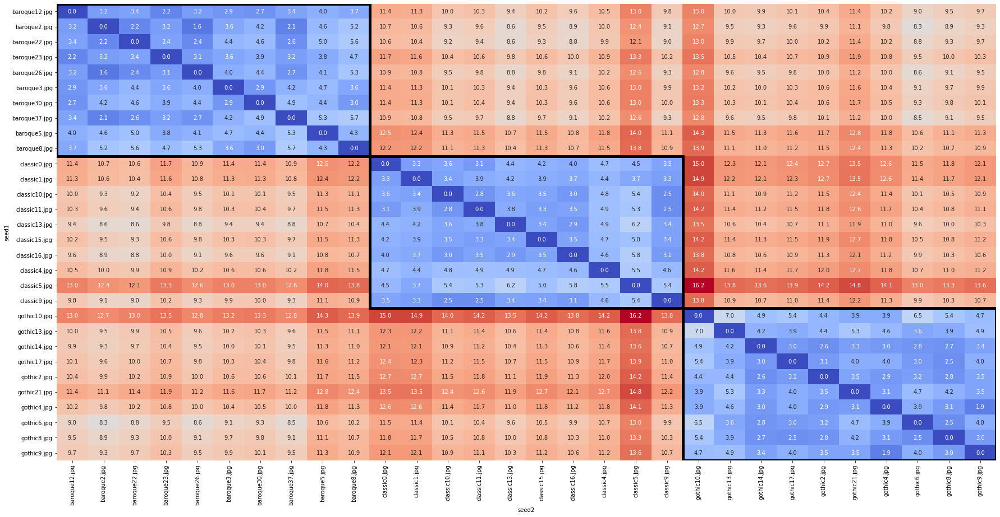

In [ ]:
fig,ax = plt.subplots(1,1, figsize=(30,15))
sns.heatmap(df_seed_vs_seed_pivoted, cmap = "coolwarm", annot= True, fmt='.1f', cbar=False)

#draw rectangles for intraclass
num_seeds_per_class = 10
num_classes = 3

for ii in range(num_classes): 
    rect = Rectangle((ii * num_seeds_per_class, ii * num_seeds_per_class),
                     num_seeds_per_class,num_seeds_per_class, 
                     linewidth=5,
                    edgecolor='black',
                    facecolor='none')
    ax.add_patch(rect)




-------------------------------------------------